In [1]:
import os
import pandas as pd
import numpy as np
import tensorflow as tf
from pathlib import Path
import matplotlib.pyplot as plt
import time 
from sklearn.utils import class_weight as cw
from keras.models import load_model
from keras.preprocessing.image import ImageDataGenerator
from keras.preprocessing import image

from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, BatchNormalization
from keras.layers import Flatten, Dense, Dropout

# Import des librairies pour la gestion des Callback
from keras.callbacks import Callback, ReduceLROnPlateau, EarlyStopping

In [97]:
EPOCHS                  = 10   # Nombre d'epoch
image_size               = (224,224)    # Taille des images
BATCH_SIZE              = 32    # Pour le traitement par lot des images (optimisation de la decente de gradient)
STOPPING_PATIENCE       = 10    # Callback pour stopper si le modèle n'apprend plus
VERBOSE                 = 0     # Niveau de verbosité
MODEL_NAME              = 'cnn_80epochs_imgsize160'
OPTIMIZER               = 'adam'
#TRAINING_DIR            = '../input/dogs-vs-cats-redux-kernels-edition/train'
#TEST_DIR                = '../input/dogs-vs-cats-redux-kernels-edition/test'
TRAIN_MODEL             = True  # Entrainement du modele (True) ou chargement (False)
batch_size = 32

In [98]:
TEST_PATH = 'D:/steve/reduced_images/test_piscine/'
TRAINING_DIR_PISCINE = "./train_piscine/"

train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    TRAINING_DIR_PISCINE,
    label_mode='categorical',
    validation_split=0.2,
    subset="training",
    seed=1337,
    color_mode="rgb",
    image_size=image_size,
    batch_size=batch_size,
)
val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    TRAINING_DIR_PISCINE,
    validation_split=0.2,
    subset="validation",
    label_mode='categorical',
    seed=1337,
    color_mode="rgb",
    image_size=image_size,
    batch_size=batch_size,
)

test = tf.keras.preprocessing.image_dataset_from_directory(
    TEST_PATH,
    label_mode=None,
    seed=1337,
    color_mode="rgb",
    image_size=image_size,
    batch_size=batch_size,
)

Found 321 files belonging to 2 classes.
Using 257 files for training.
Found 321 files belonging to 2 classes.
Using 64 files for validation.
Found 561 files belonging to 1 classes.


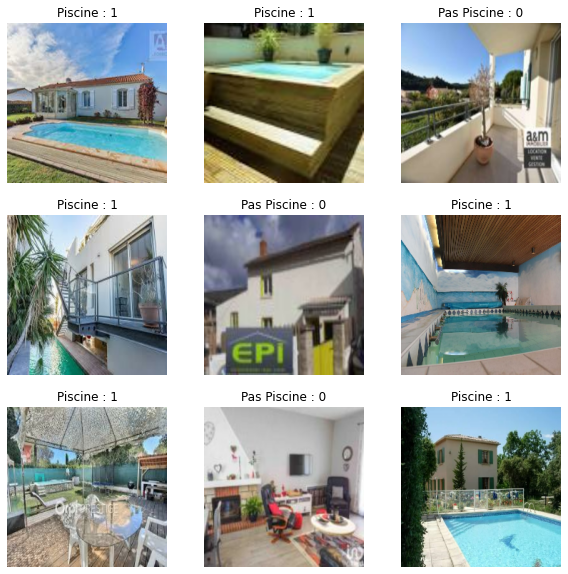

In [76]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        if labels[i][0].numpy()==0.0:
            plt.title("Piscine : 1")
        else:
            plt.title("Pas Piscine : 0")
        plt.axis("off")

### Rajouter plus de couches je pense

In [81]:
# Initialisation du modèle

data_augmentation = tf.keras.Sequential([
  tf.keras.layers.experimental.preprocessing.RandomFlip('horizontal'),
  tf.keras.layers.experimental.preprocessing.RandomRotation(0.2),
tf.keras.layers.experimental.preprocessing.RandomCrop(224,224),
    tf.keras.layers.experimental.preprocessing.Rescaling(1./255),
tf.keras.layers.Conv2D(filters=16,
                      kernel_size=3,
                      strides=1,
                      padding='same',
                      input_shape=(224, 224, 3),
                      activation='relu'),
tf.keras.layers.BatchNormalization(),
tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2),
tf.keras.layers.Conv2D(filters=16,
                      kernel_size=3,
                      strides=1,
                      padding='same',
                      activation='relu'),
tf.keras.layers.BatchNormalization(),
tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2),
tf.keras.layers.Dropout(0.1),
tf.keras.layers.Conv2D(filters=32,
                      kernel_size=3,
                      strides=1,
                      padding='same',
                      activation='relu'),
tf.keras.layers.BatchNormalization(),
tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2),
tf.keras.layers.Conv2D(filters=32,
                      kernel_size=3,
                      strides=1,
                      padding='same',
                      activation='relu'),
tf.keras.layers.BatchNormalization(),
tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=2),
tf.keras.layers.Flatten(),
tf.keras.layers.Dense(512, activation='relu'),
tf.keras.layers.Dropout(0.1)
])

inputs = tf.keras.Input(shape=(224,224,3))
x = data_augmentation(inputs)
#x = preprocess_input(x)

#x = GlobalAveragePooling2D()(x)
y = Dense(2, activation='softmax')(x) #final layer with softmax activation
model = Model(inputs=inputs, outputs=y, name="Steven")

model.compile(
    optimizer=OPTIMIZER,
    loss='categorical_crossentropy',
    metrics=['accuracy','AUC'])
model.summary()  # As a reminder.



Model: "Steven"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_17 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 sequential_16 (Sequential)  (None, 512)               3228816   
                                                                 
 dense_12 (Dense)            (None, 2)                 1026      
                                                                 
Total params: 3,229,842
Trainable params: 3,229,650
Non-trainable params: 192
_________________________________________________________________


In [82]:

history = model.fit(train_ds, epochs=20, validation_data=val_ds)

Epoch 1/20
9/9 [==============================] - 10s 960ms/step - loss: 1.3717 - accuracy: 0.8366 - auc: 0.8924 - val_loss: 0.6447 - val_accuracy: 0.6562 - val_auc: 0.7532
Epoch 2/20
9/9 [==============================] - 8s 862ms/step - loss: 1.2444 - accuracy: 0.8677 - auc: 0.9144 - val_loss: 6.3682 - val_accuracy: 0.4688 - val_auc: 0.4688
Epoch 3/20
9/9 [==============================] - 8s 861ms/step - loss: 0.8133 - accuracy: 0.9144 - auc: 0.9556 - val_loss: 14.3982 - val_accuracy: 0.4688 - val_auc: 0.4688
Epoch 4/20
9/9 [==============================] - 8s 862ms/step - loss: 0.5680 - accuracy: 0.9339 - auc: 0.9553 - val_loss: 17.0017 - val_accuracy: 0.4688 - val_auc: 0.4688
Epoch 5/20
9/9 [==============================] - 8s 862ms/step - loss: 0.9188 - accuracy: 0.8794 - auc: 0.9218 - val_loss: 18.2467 - val_accuracy: 0.4688 - val_auc: 0.4688
Epoch 6/20
9/9 [==============================] - 8s 860ms/step - loss: 0.4158 - accuracy: 0.9027 - auc: 0.9557 - val_loss: 24.2660 - va

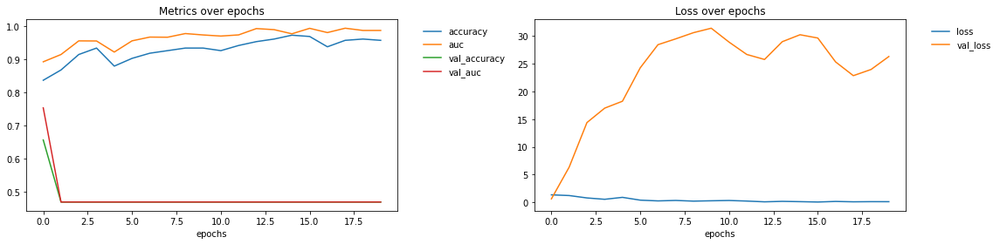

In [83]:
fig, axs = plt.subplots(1, 2, figsize=(16, 4))

axs[0].plot(history.history["accuracy"], label="accuracy")
axs[0].plot(history.history["auc"], label="auc")

axs[0].plot(history.history["val_accuracy"], label="val_accuracy")
axs[0].plot(history.history["val_auc"], label="val_auc")

axs[0].set_title("Metrics over epochs")
axs[0].set_xlabel("epochs")

axs[0].legend(bbox_to_anchor=(1.05, 1), loc='upper left', frameon=False)

axs[1].plot(history.history["loss"], label="loss")
axs[1].plot(history.history["val_loss"], label="val_loss")

axs[1].set_title("Loss over epochs")
axs[1].set_xlabel("epochs")
axs[1].legend(bbox_to_anchor=(1.05, 1), loc='upper left', frameon=False)

fig.tight_layout()
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


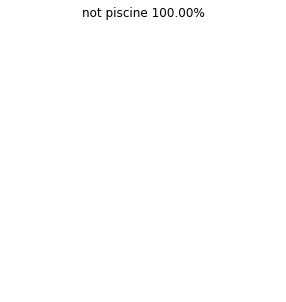

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


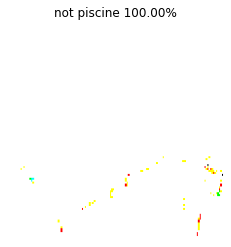

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


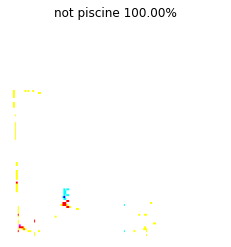

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


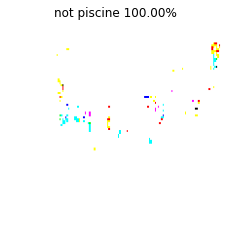

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


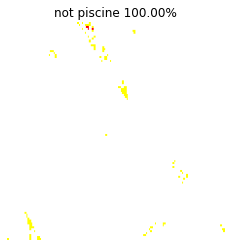

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


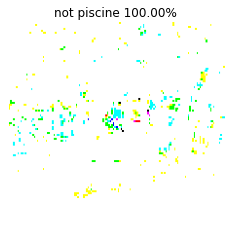

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


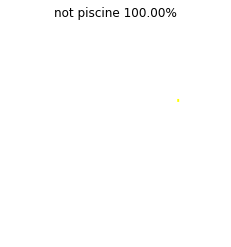

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


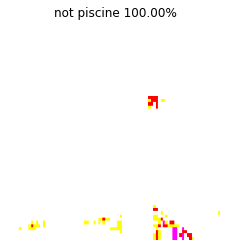

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


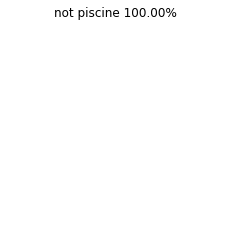

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


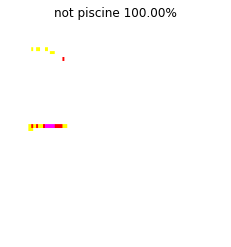

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


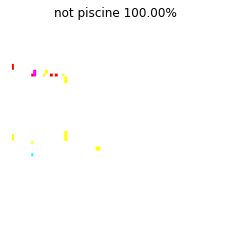

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


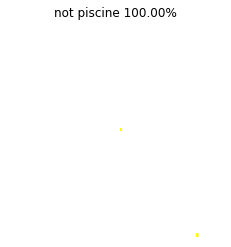

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


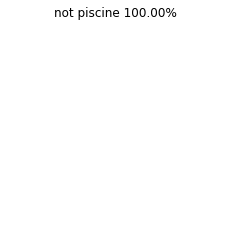

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


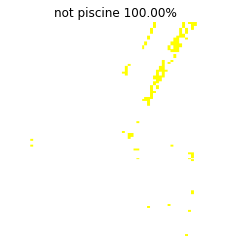

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


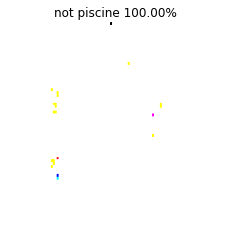

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


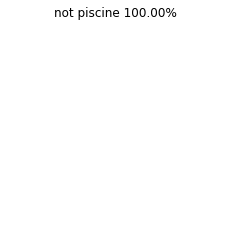

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


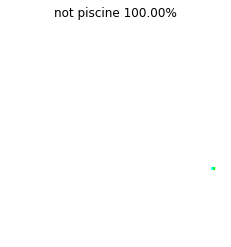

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


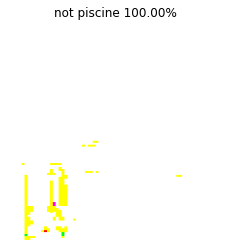

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


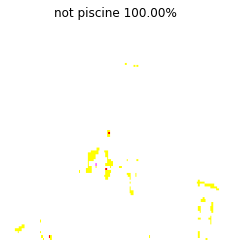

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


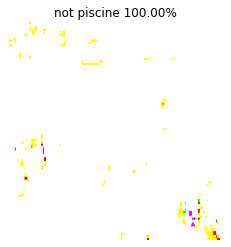

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


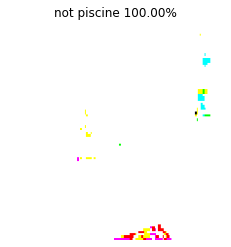

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


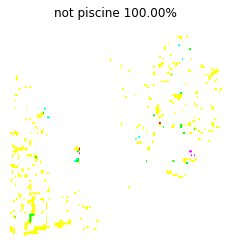

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


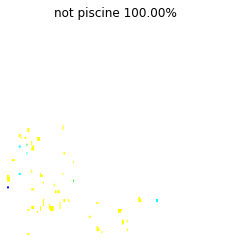

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


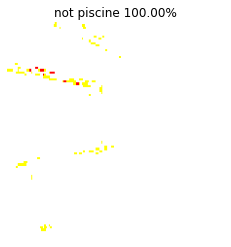

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


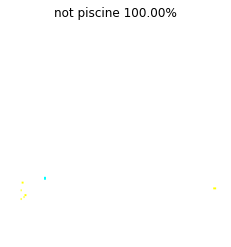

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


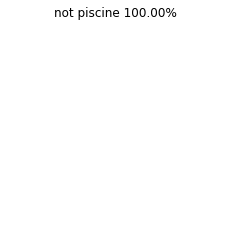

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


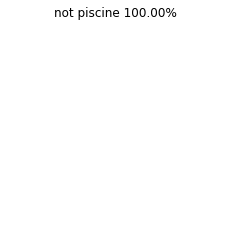

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


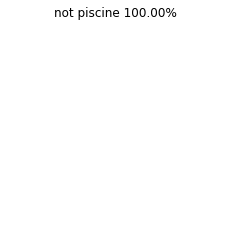

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


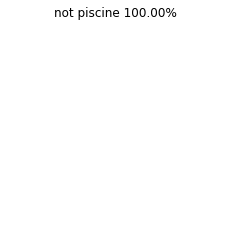

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


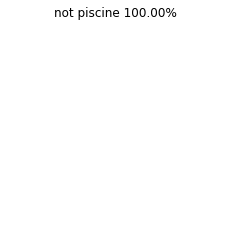

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


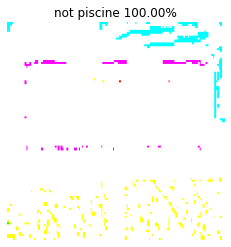

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


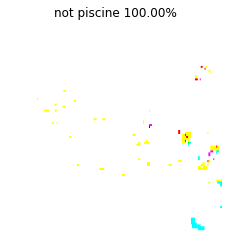

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


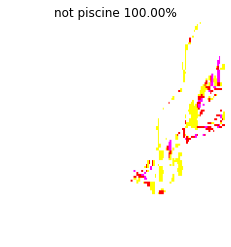

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


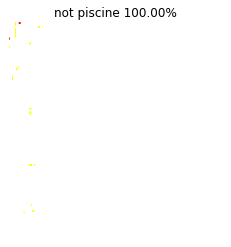

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


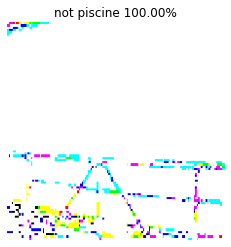

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


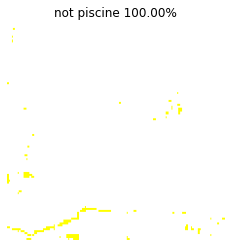

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


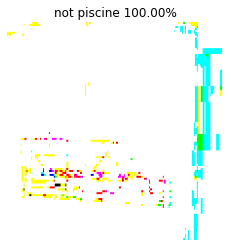

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


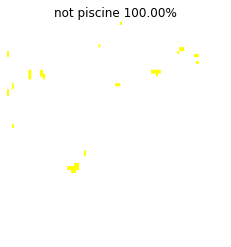

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


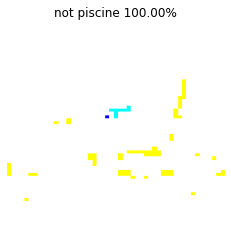

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


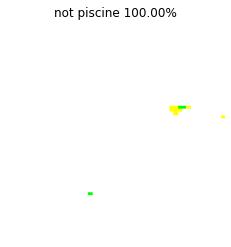

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


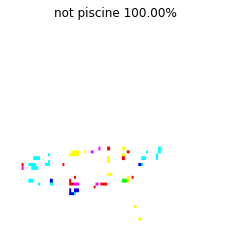

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


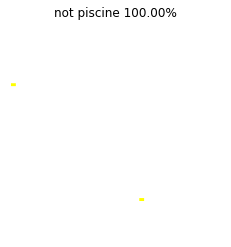

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


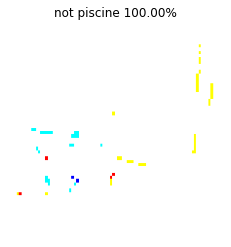

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


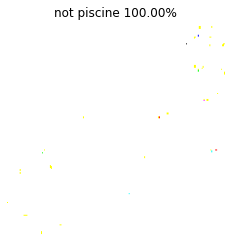

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


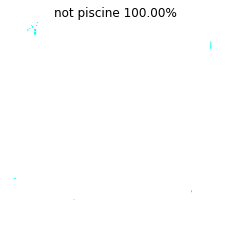

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


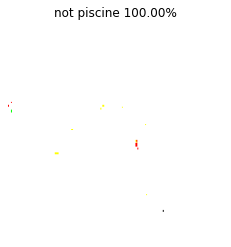

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


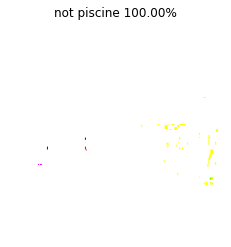

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


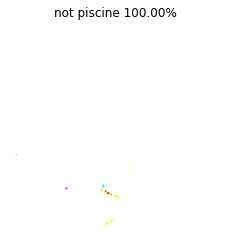

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


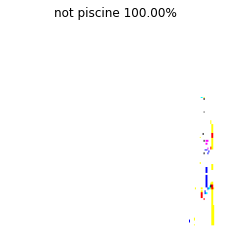

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


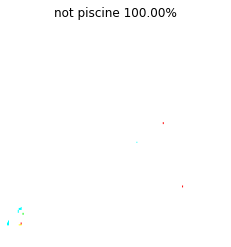

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


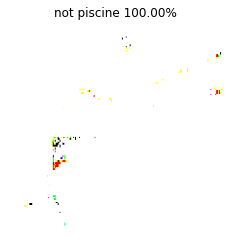

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


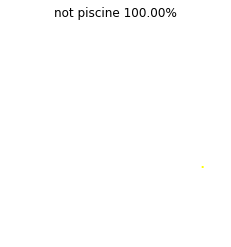

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


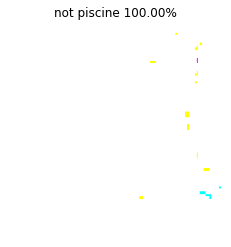

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


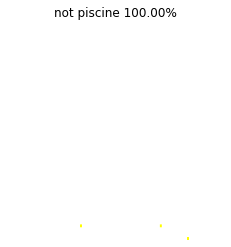

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


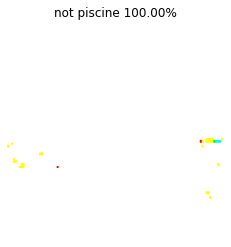

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


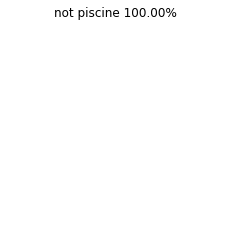

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


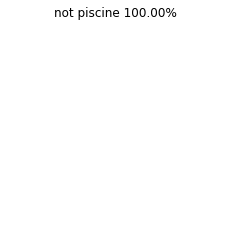

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


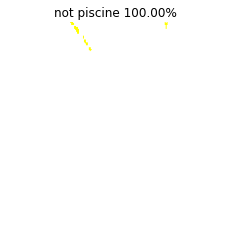

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


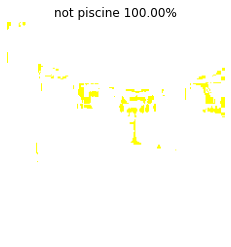

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


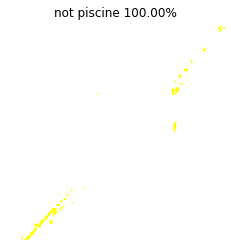

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


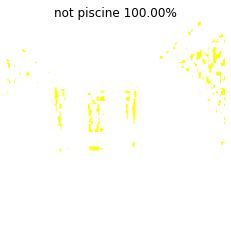

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


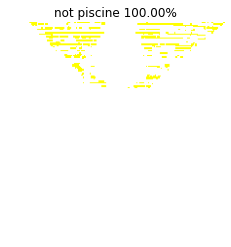

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


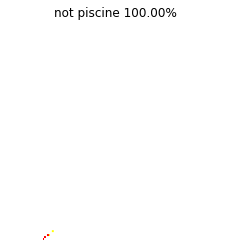

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


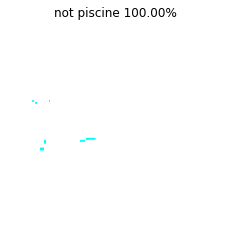

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


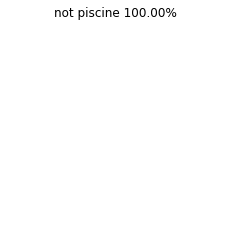

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


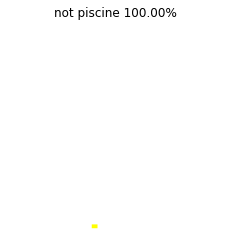

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


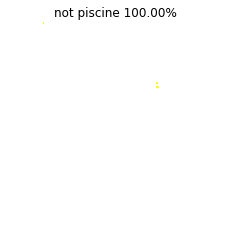

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


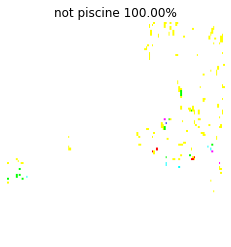

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


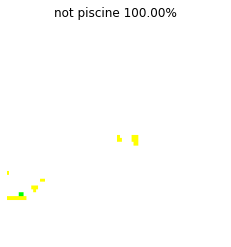

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


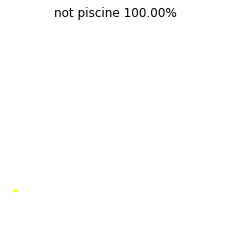

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


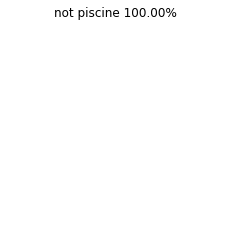

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


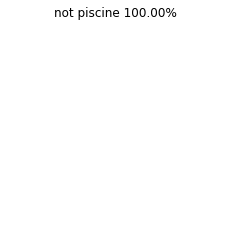

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


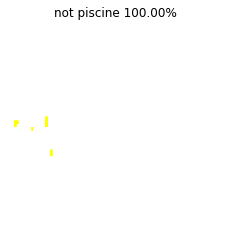

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


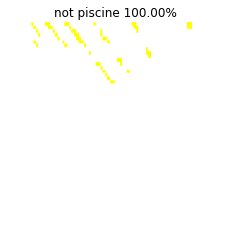

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


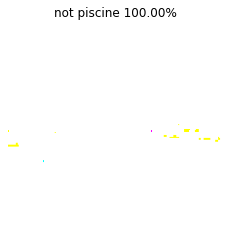

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


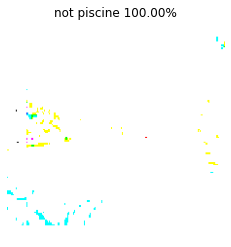

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


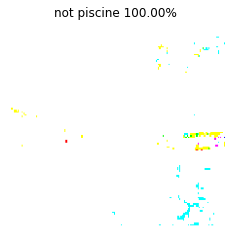

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


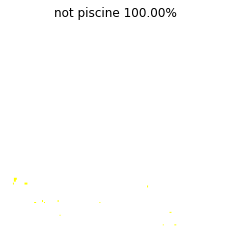

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


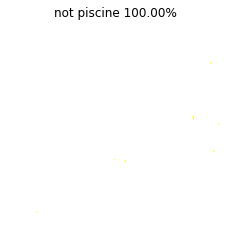

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


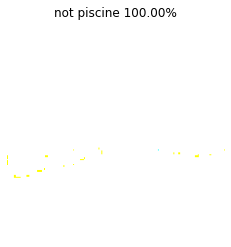

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


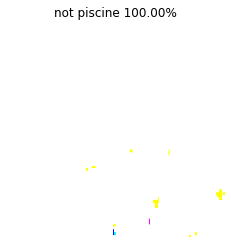

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


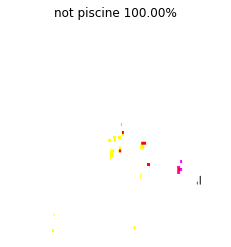

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


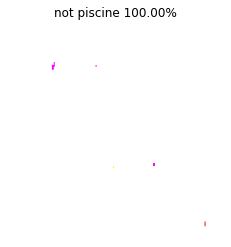

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


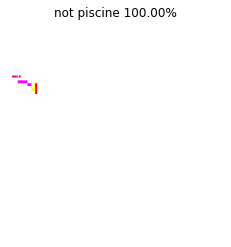

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


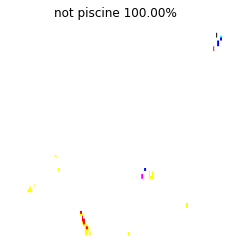

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


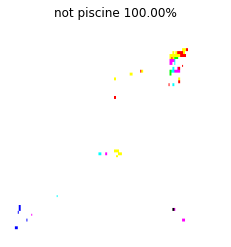

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


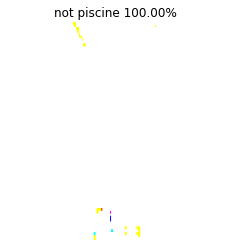

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


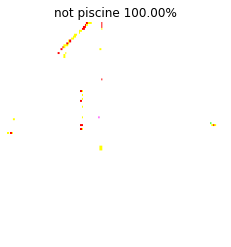

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


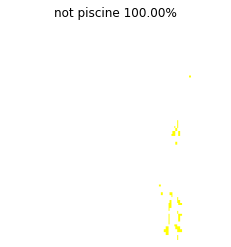

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


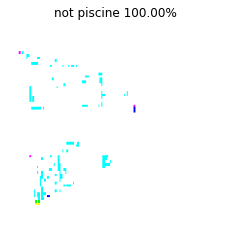

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


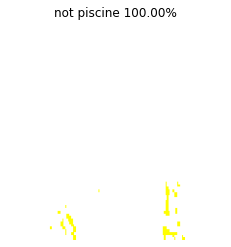

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


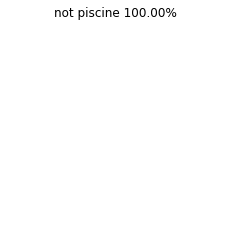

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


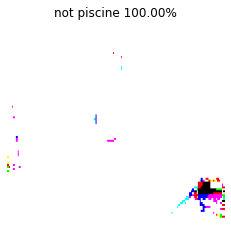

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


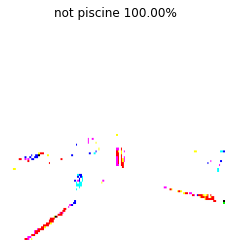

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


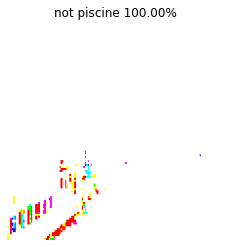

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


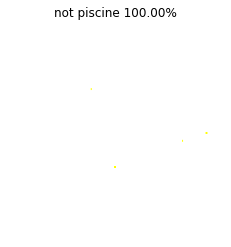

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


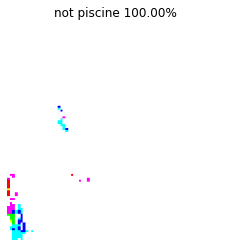

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


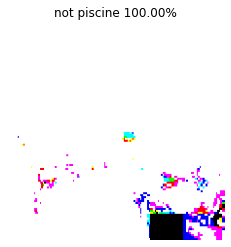

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


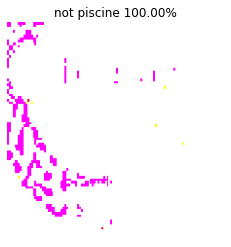

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


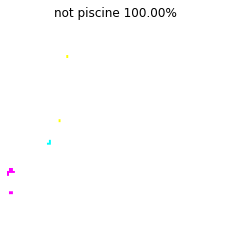

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


KeyboardInterrupt: 

In [84]:
from keras import models

# Extracts the outputs of the top 4 layers:
layer_outputs = [layer.output for layer in model.layers[:4]]
# Creates a model that will return these outputs, given the model input:
activation_model = model

def preprocess_image(img_path):
    image = load_img(img_path, target_size=image_size)
    image = img_to_array(image) 
    # change it to shape [1, 150, 150, 3]
    image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
    image = preprocess_input(image)
    #img_tensor = np.expand_dims(img_tensor, axis=0)
    #img_tensor /= 255.
    return image

plt.figure(figsize=(5, 5))
for index, image in enumerate(test_iamges):
    for file in os.listdir(TEST_PATH + image+'/'):
        filename = TEST_PATH + image+'/'+file
        img = preprocess_image(filename)
        prediction = model.predict(img)
        #plt.subplot(5, 5, index+1)
        if prediction[0][0] > 0.5:
            plt.title('not piscine %.2f%%' % (100 - prediction[0][1]*100))
        else:
            plt.title('piscine %.2f%%' % (prediction[0][1]*100))

        plt.axis('off')
        plt.imshow(img[0])
        plt.show()

### VGG16


In [99]:
from keras.applications.vgg16 import VGG16
model = VGG16()

model.compile(
    optimizer=OPTIMIZER,
    loss='categorical_crossentropy',
    metrics=['accuracy','AUC'])
print(model.summary())

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_20 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

#### il faut reussir à train sur les piscines avec le VGG

In [100]:

history = model.fit(train_ds, epochs=20, validation_data=val_ds)

fig, axs = plt.subplots(1, 2, figsize=(16, 4))

axs[0].plot(history.history["accuracy"], label="accuracy")
axs[0].plot(history.history["auc"], label="auc")

axs[0].plot(history.history["val_accuracy"], label="val_accuracy")
axs[0].plot(history.history["val_auc"], label="val_auc")

axs[0].set_title("Metrics over epochs")
axs[0].set_xlabel("epochs")

axs[0].legend(bbox_to_anchor=(1.05, 1), loc='upper left', frameon=False)

axs[1].plot(history.history["loss"], label="loss")
axs[1].plot(history.history["val_loss"], label="val_loss")

axs[1].set_title("Loss over epochs")
axs[1].set_xlabel("epochs")
axs[1].legend(bbox_to_anchor=(1.05, 1), loc='upper left', frameon=False)

fig.tight_layout()
plt.show()

Epoch 1/20


ValueError: in user code:

    File "C:\Users\steve\AppData\Roaming\Python\Python38\site-packages\keras\engine\training.py", line 878, in train_function  *
        return step_function(self, iterator)
    File "C:\Users\steve\AppData\Roaming\Python\Python38\site-packages\keras\engine\training.py", line 867, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "C:\Users\steve\AppData\Roaming\Python\Python38\site-packages\keras\engine\training.py", line 860, in run_step  **
        outputs = model.train_step(data)
    File "C:\Users\steve\AppData\Roaming\Python\Python38\site-packages\keras\engine\training.py", line 809, in train_step
        loss = self.compiled_loss(
    File "C:\Users\steve\AppData\Roaming\Python\Python38\site-packages\keras\engine\compile_utils.py", line 201, in __call__
        loss_value = loss_obj(y_t, y_p, sample_weight=sw)
    File "C:\Users\steve\AppData\Roaming\Python\Python38\site-packages\keras\losses.py", line 141, in __call__
        losses = call_fn(y_true, y_pred)
    File "C:\Users\steve\AppData\Roaming\Python\Python38\site-packages\keras\losses.py", line 245, in call  **
        return ag_fn(y_true, y_pred, **self._fn_kwargs)
    File "C:\Users\steve\AppData\Roaming\Python\Python38\site-packages\keras\losses.py", line 1664, in categorical_crossentropy
        return backend.categorical_crossentropy(
    File "C:\Users\steve\AppData\Roaming\Python\Python38\site-packages\keras\backend.py", line 4994, in categorical_crossentropy
        target.shape.assert_is_compatible_with(output.shape)

    ValueError: Shapes (None, 2) and (None, 1000) are incompatible


In [104]:
test_iamges  = os.listdir(TEST_PATH)

from keras.preprocessing.image import load_img, img_to_array
from keras.applications.vgg16 import decode_predictions

from keras.applications.vgg16 import preprocess_input

def preprocess_imageVGG(img_path):
    image = load_img(img_path, target_size=image_size)
    image = img_to_array(image) 
    # change it to shape [1, 150, 150, 3]
    image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
    image = preprocess_input(image)
    #img_tensor = np.expand_dims(img_tensor, axis=0)
    #img_tensor /= 255.
    return image

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


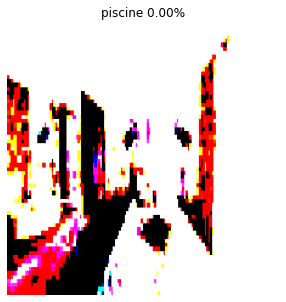

mosquito_net (56.88%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


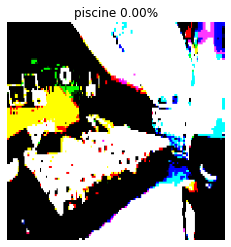

studio_couch (34.34%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


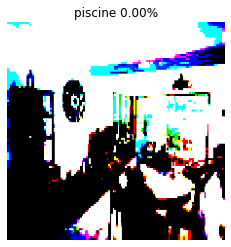

barbershop (32.67%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


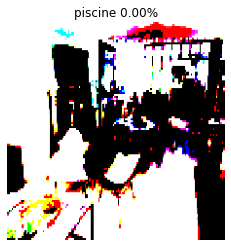

dining_table (35.21%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


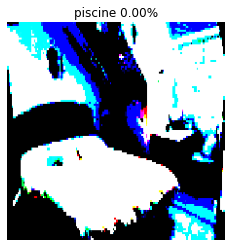

prison (18.81%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


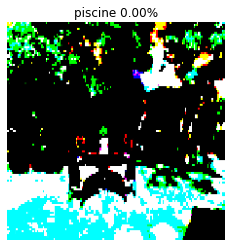

park_bench (14.63%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


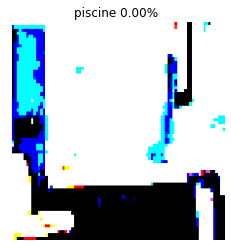

medicine_chest (27.20%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


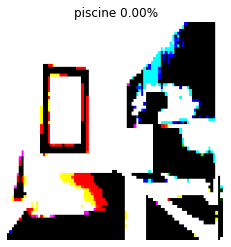

bannister (24.90%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


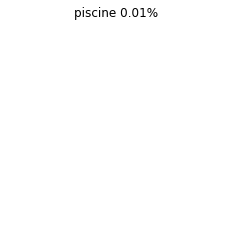

safe (14.03%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


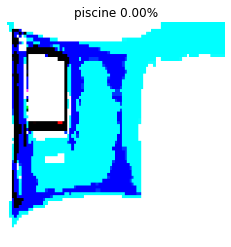

shoji (19.64%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


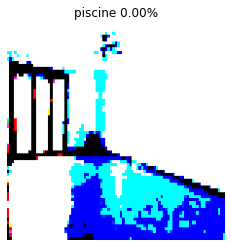

sliding_door (28.61%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


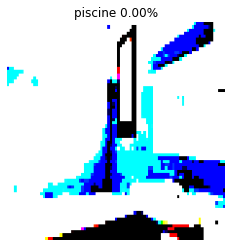

sliding_door (21.52%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


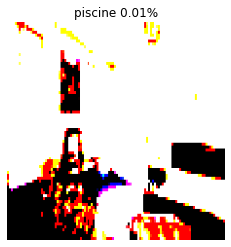

dining_table (19.23%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


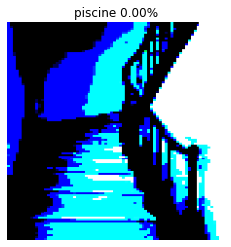

bannister (85.42%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


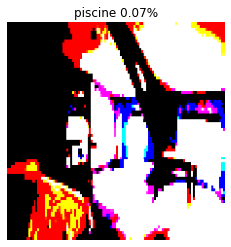

fountain (42.20%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


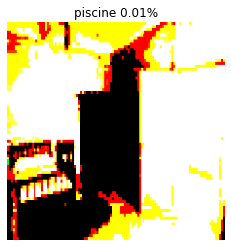

sliding_door (55.26%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


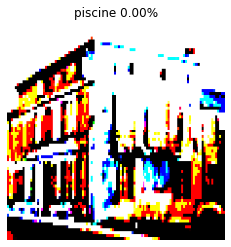

palace (67.01%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


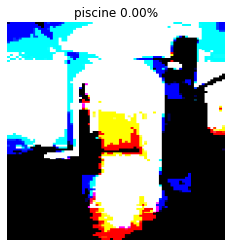

sliding_door (33.26%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


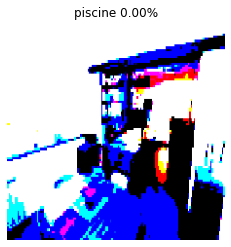

microwave (14.61%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


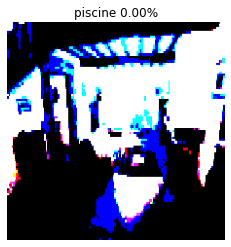

restaurant (58.04%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


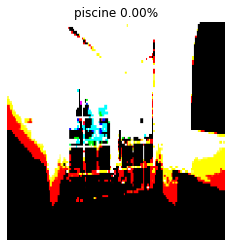

sliding_door (55.11%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


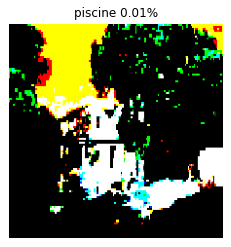

church (27.46%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


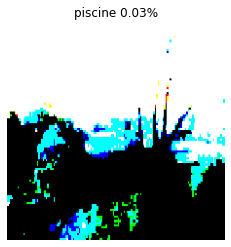

lakeside (25.60%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


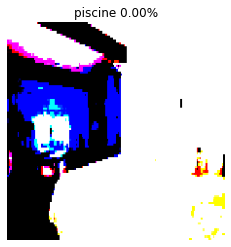

four-poster (72.54%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


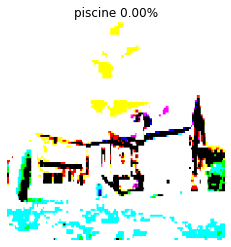

monastery (34.64%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


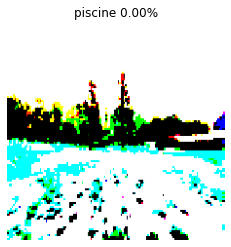

bison (28.86%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


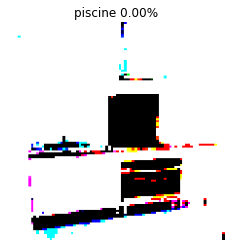

microwave (77.25%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


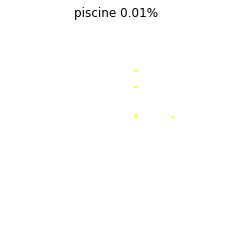

desk (11.73%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


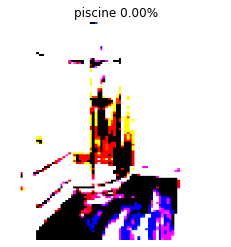

refrigerator (24.31%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


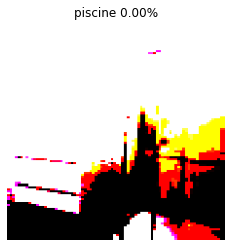

medicine_chest (46.82%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


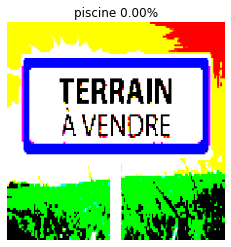

street_sign (73.06%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


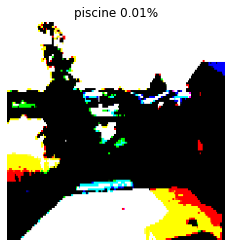

boathouse (50.74%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


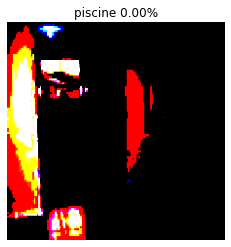

bannister (13.68%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


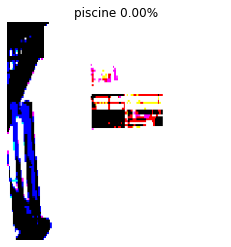

bookcase (13.17%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


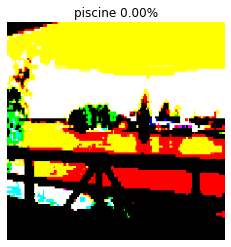

lakeside (70.89%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


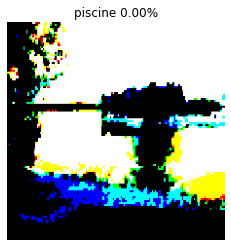

lakeside (90.96%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


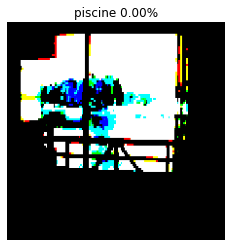

sliding_door (88.49%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


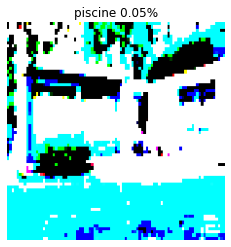

boathouse (27.29%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


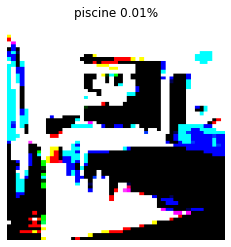

library (32.57%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


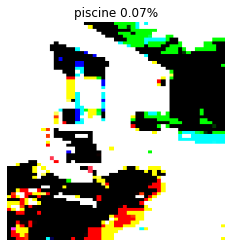

boathouse (63.56%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


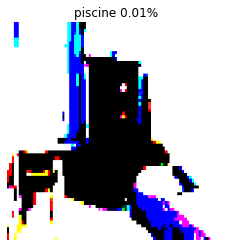

shoji (44.40%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


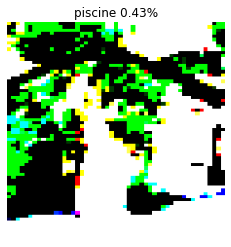

window_screen (12.08%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


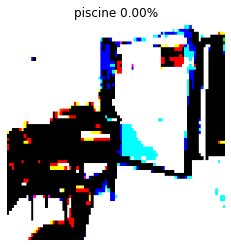

sliding_door (17.04%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


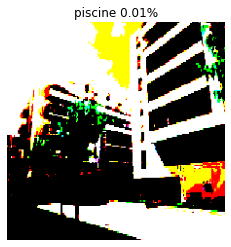

bell_cote (9.48%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


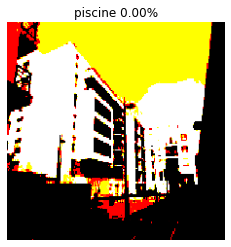

obelisk (31.40%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


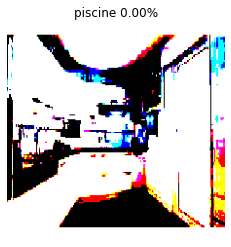

microwave (19.11%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


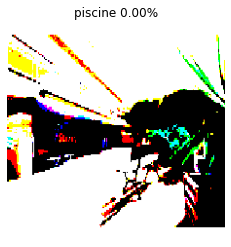

patio (43.65%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


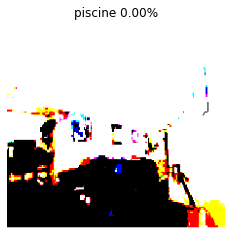

barbershop (47.09%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


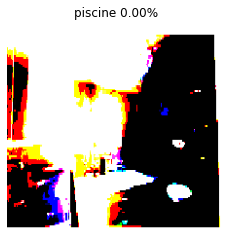

medicine_chest (58.50%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


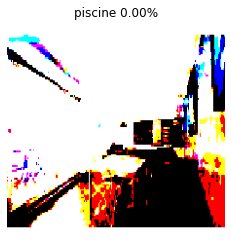

sliding_door (14.69%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


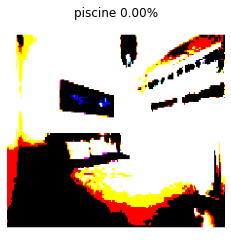

studio_couch (43.50%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


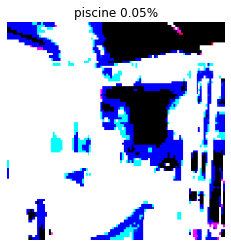

china_cabinet (16.11%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


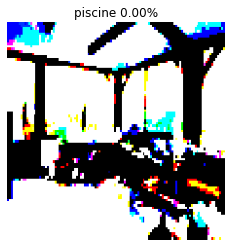

restaurant (71.35%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


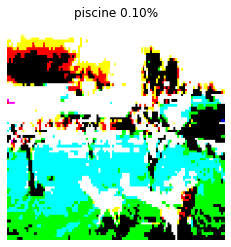

crane (7.74%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


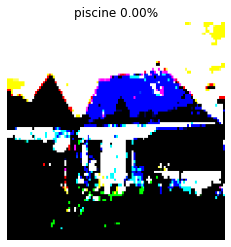

barn (51.84%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


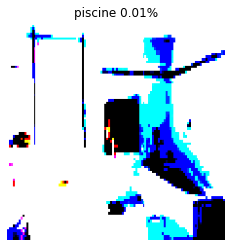

four-poster (9.83%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


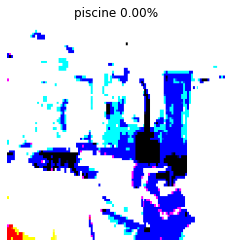

restaurant (54.02%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


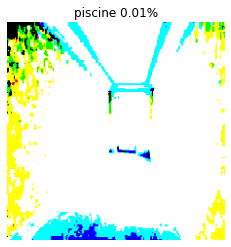

lampshade (11.65%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


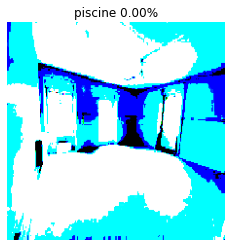

prison (11.03%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


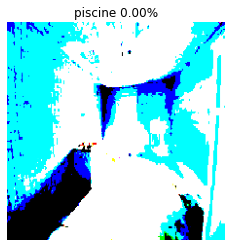

vault (41.41%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


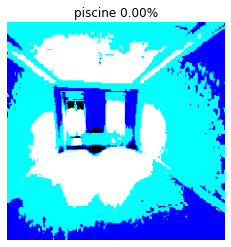

mosquito_net (14.14%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


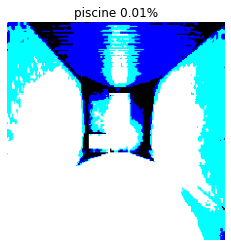

butternut_squash (17.25%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


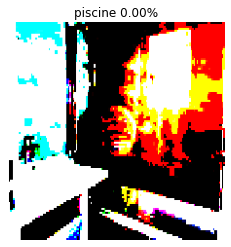

sliding_door (19.73%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


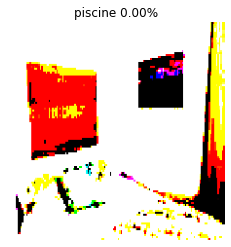

medicine_chest (15.74%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


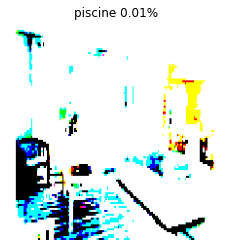

dining_table (14.30%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


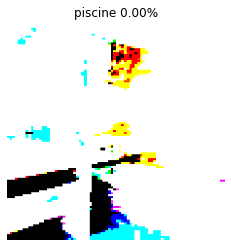

refrigerator (71.25%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


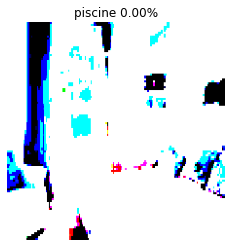

four-poster (67.35%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


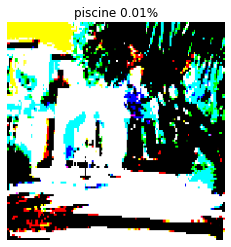

palace (39.75%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


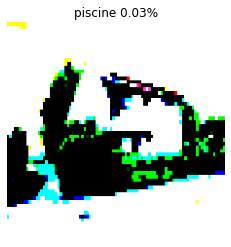

boathouse (30.59%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


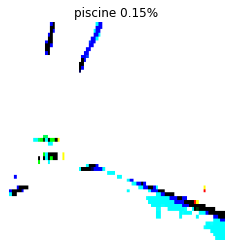

sliding_door (6.99%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


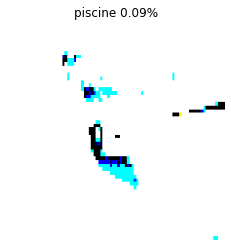

window_shade (15.56%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


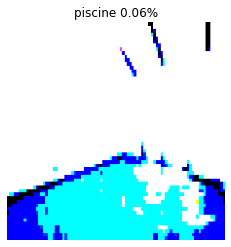

prison (28.95%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


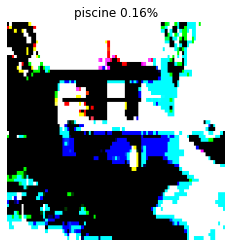

boathouse (7.04%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


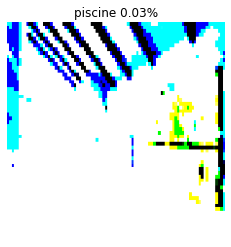

window_screen (17.82%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


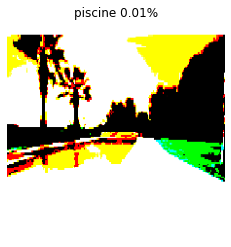

patio (8.63%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


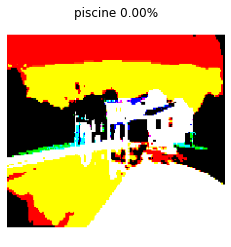

dam (36.02%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


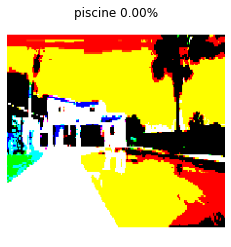

patio (37.48%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


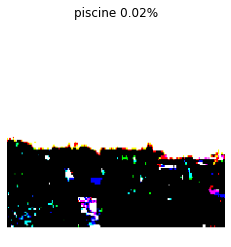

lakeside (12.68%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


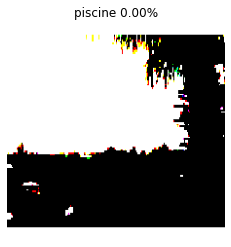

lakeside (37.06%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


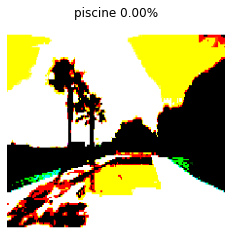

monitor (13.87%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


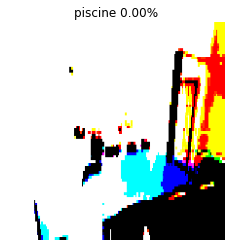

dining_table (77.67%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


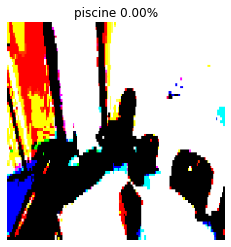

shower_curtain (5.34%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


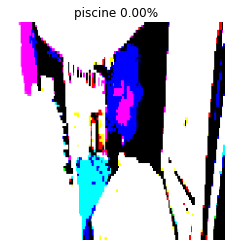

fur_coat (16.04%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


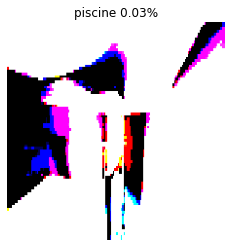

mosquito_net (17.96%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


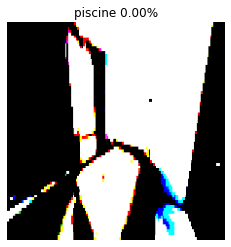

cloak (17.00%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


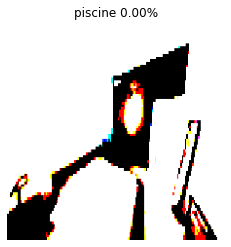

shower_curtain (5.88%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


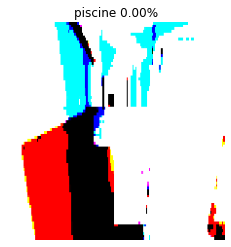

bookcase (10.32%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


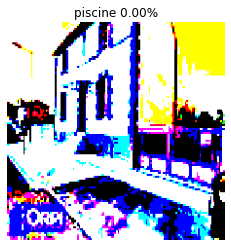

horse_cart (6.12%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


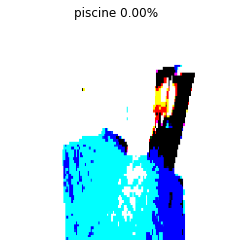

shower_curtain (31.08%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


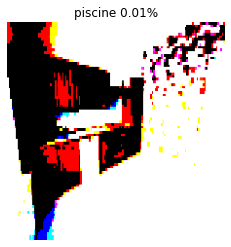

bannister (12.82%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


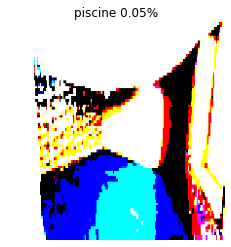

mosquito_net (17.10%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


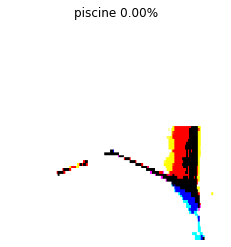

four-poster (30.72%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


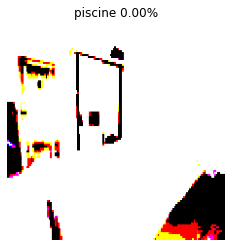

four-poster (25.46%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


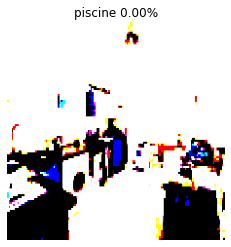

microwave (61.28%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


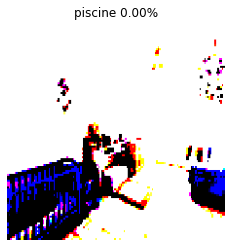

crib (53.74%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


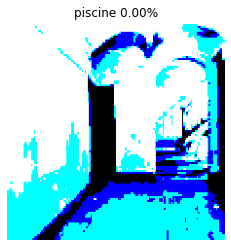

vault (38.85%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


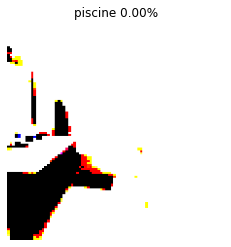

refrigerator (20.08%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


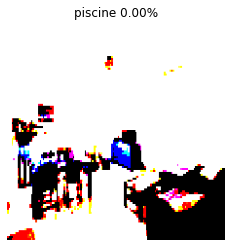

restaurant (50.76%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


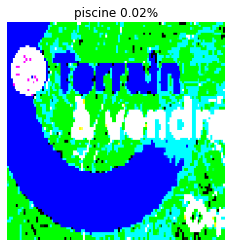

apron (17.98%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


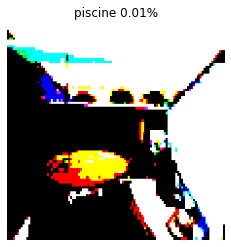

patio (9.93%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


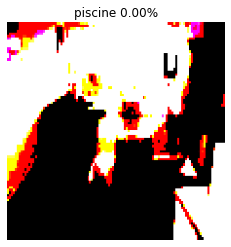

dining_table (33.28%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


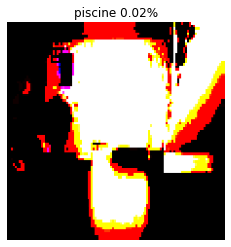

prison (27.04%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


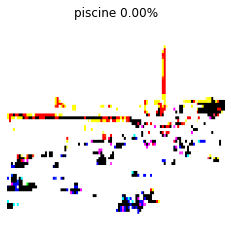

dock (17.53%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


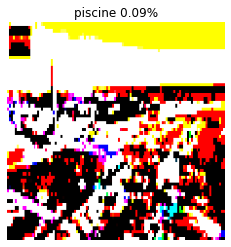

boathouse (19.16%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


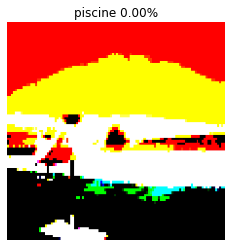

geyser (21.89%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


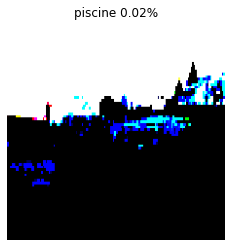

lakeside (4.90%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


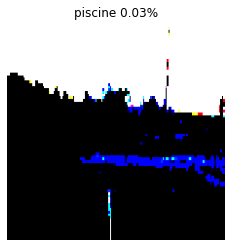

American_egret (14.24%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


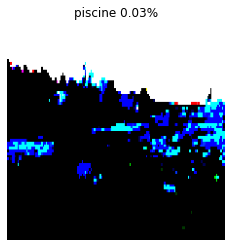

lakeside (14.04%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


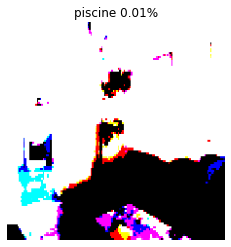

china_cabinet (10.09%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


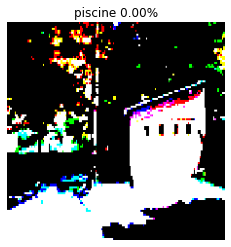

mobile_home (38.75%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


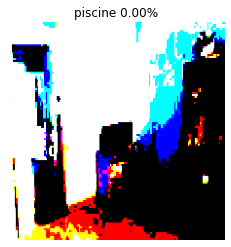

bookcase (35.12%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


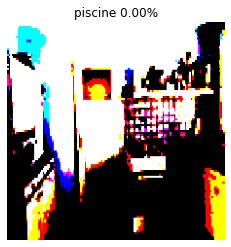

microwave (67.41%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


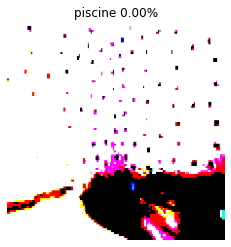

four-poster (19.35%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


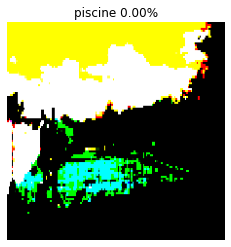

lakeside (15.45%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


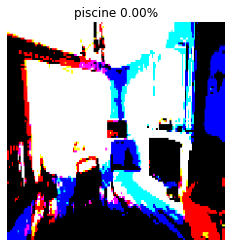

four-poster (29.12%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


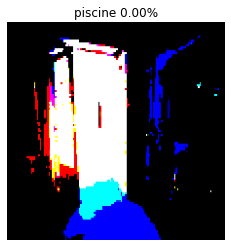

prison (42.83%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


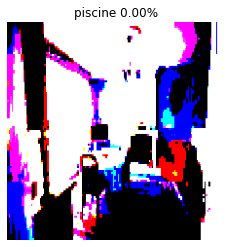

four-poster (14.10%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


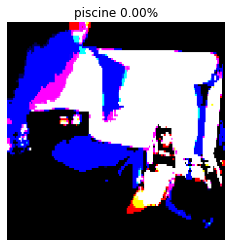

dining_table (17.68%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


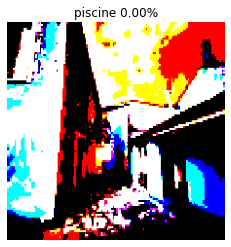

monastery (36.27%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


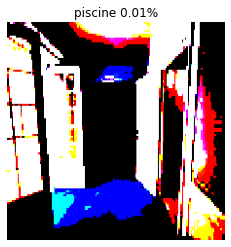

sliding_door (60.08%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


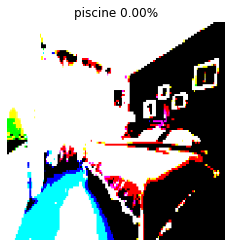

tub (28.91%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


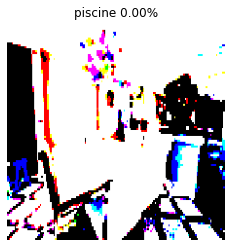

restaurant (18.05%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


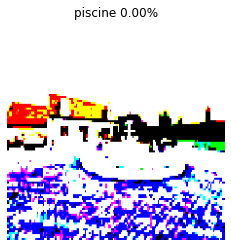

lakeside (13.01%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


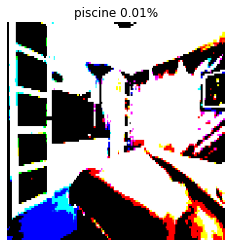

window_shade (17.94%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


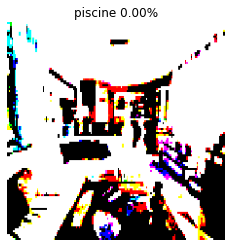

bullet_train (14.99%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


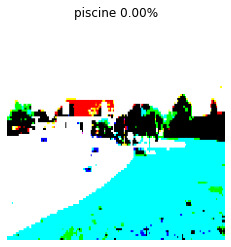

lakeside (13.99%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


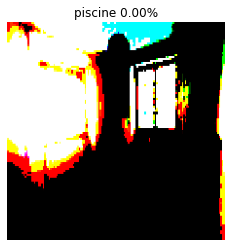

sliding_door (34.29%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


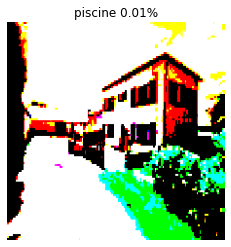

geyser (24.22%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


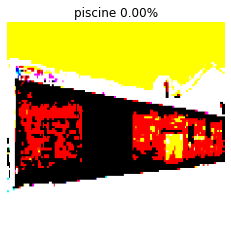

dam (48.60%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


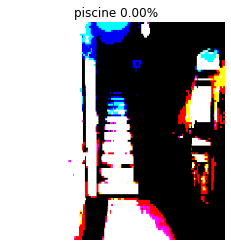

prison (85.68%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


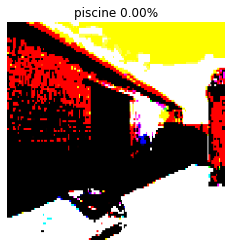

mobile_home (42.55%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


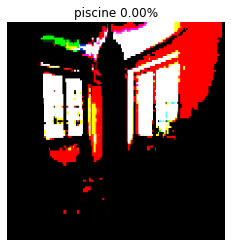

prison (41.93%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


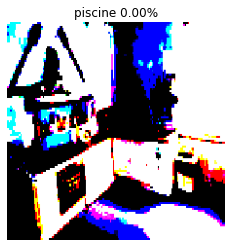

studio_couch (9.17%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


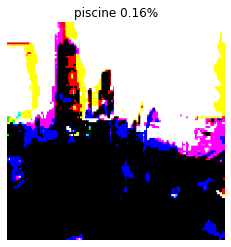

shower_curtain (15.53%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


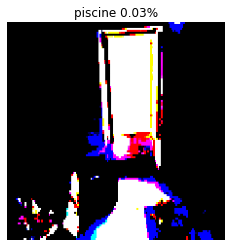

china_cabinet (15.82%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


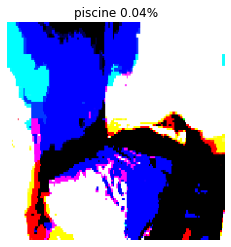

four-poster (6.69%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


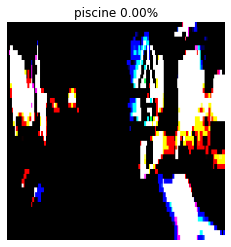

vault (24.13%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


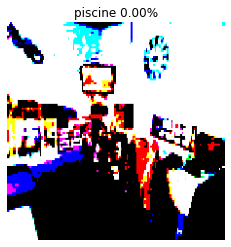

restaurant (71.59%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


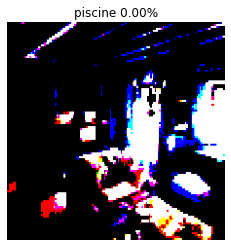

restaurant (32.99%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


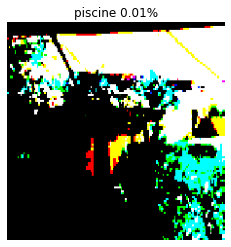

crane (23.15%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


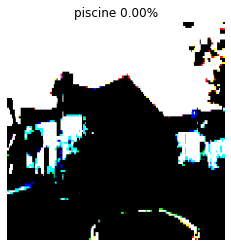

monastery (23.52%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


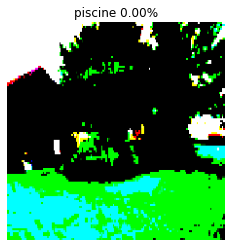

mobile_home (49.02%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


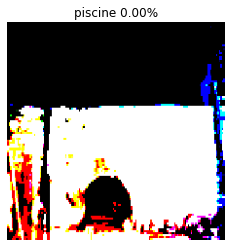

vault (30.50%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


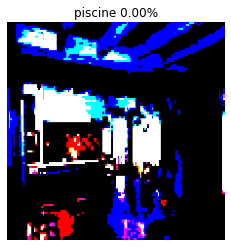

restaurant (51.05%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


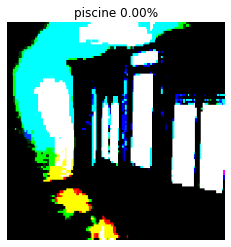

sliding_door (31.19%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


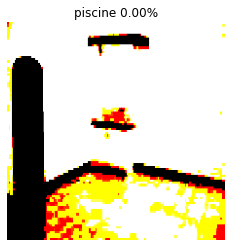

refrigerator (28.02%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


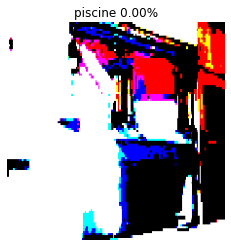

palace (37.86%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


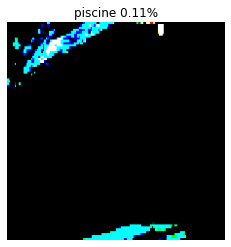

vault (17.78%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


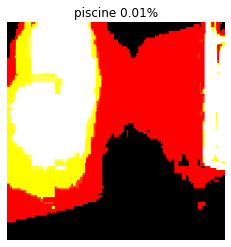

medicine_chest (12.48%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


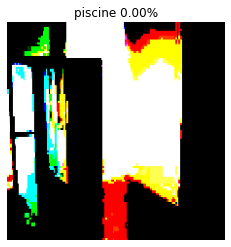

sliding_door (28.55%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


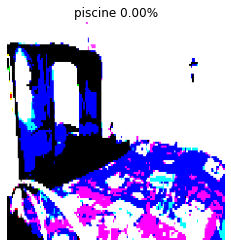

quilt (63.71%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


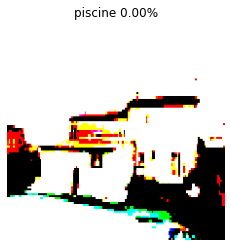

dam (17.29%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


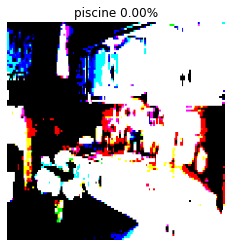

microwave (45.66%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


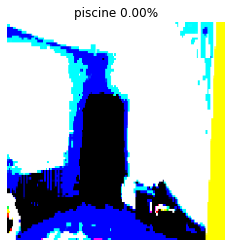

four-poster (35.80%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


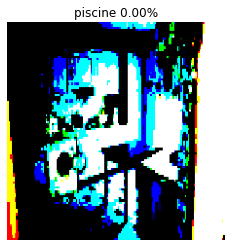

medicine_chest (38.08%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


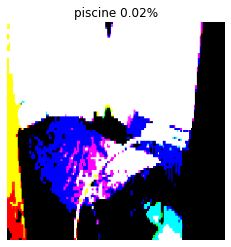

mosquito_net (56.94%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


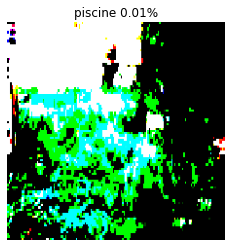

apiary (6.64%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


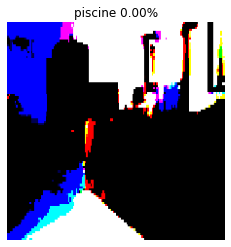

grand_piano (6.36%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


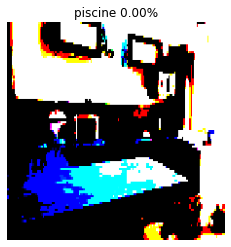

dining_table (39.77%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


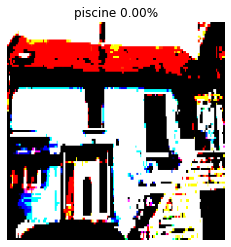

palace (25.01%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


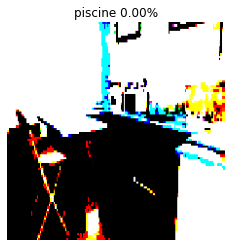

desk (17.21%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


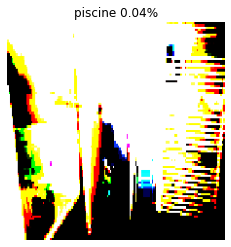

sliding_door (20.75%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


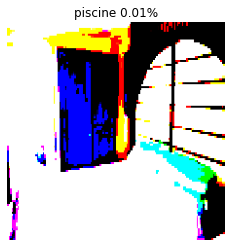

studio_couch (10.53%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


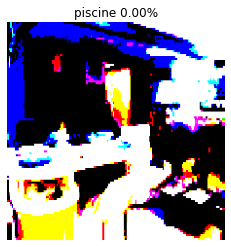

restaurant (56.87%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


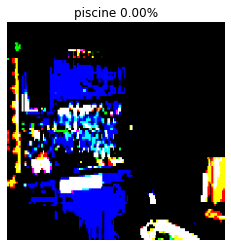

microwave (16.24%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


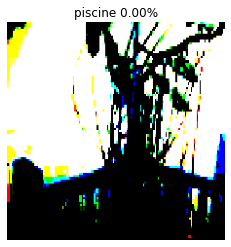

crib (43.17%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


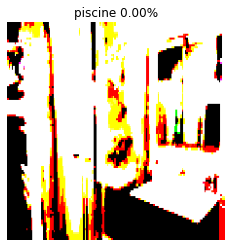

medicine_chest (62.50%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


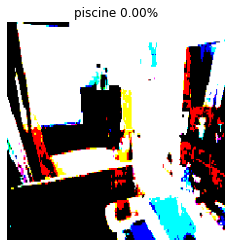

barbershop (26.43%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


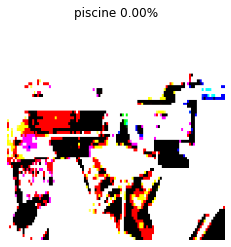

fireboat (49.72%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


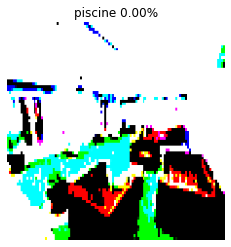

dam (57.80%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


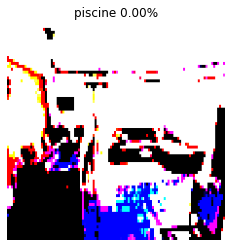

mosquito_net (81.35%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


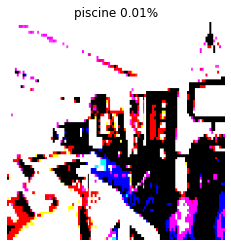

prison (27.47%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


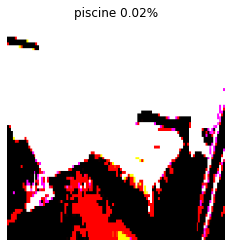

mosquito_net (21.03%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


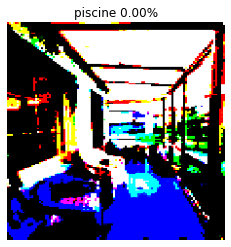

greenhouse (55.27%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


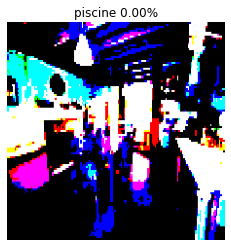

restaurant (90.74%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


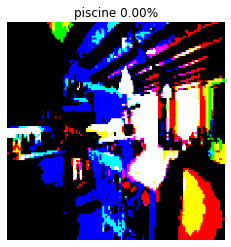

restaurant (51.80%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


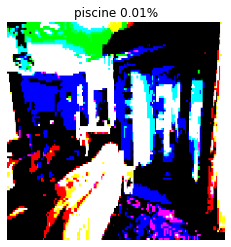

four-poster (22.67%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


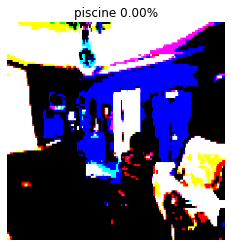

barber_chair (17.81%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


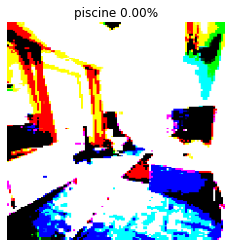

sliding_door (11.68%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


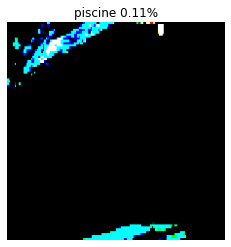

vault (17.78%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


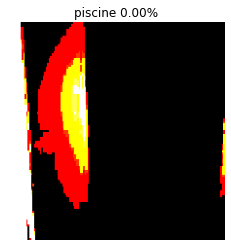

sliding_door (50.57%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


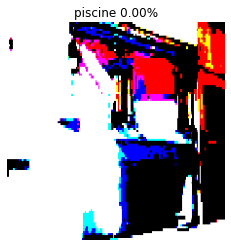

palace (37.86%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


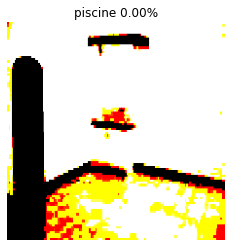

refrigerator (28.02%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


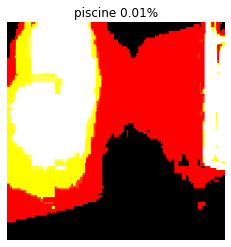

medicine_chest (12.48%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


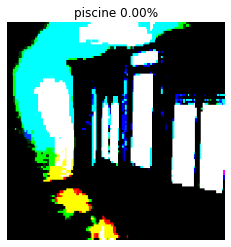

sliding_door (31.19%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


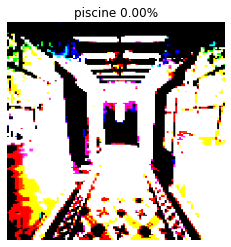

prison (25.48%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


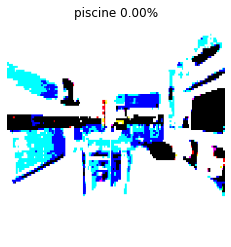

microwave (34.56%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


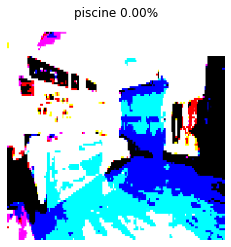

microwave (30.57%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


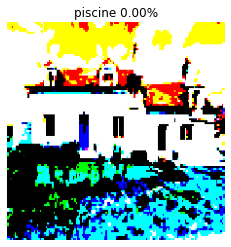

monastery (45.20%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


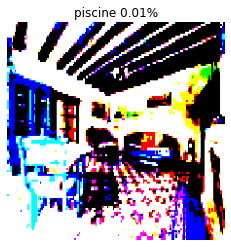

restaurant (59.78%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


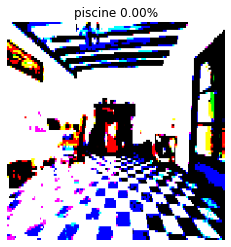

shoji (45.87%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


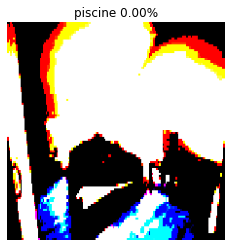

dining_table (19.69%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


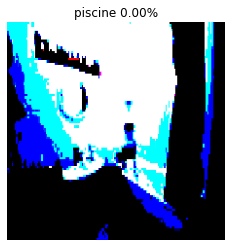

shower_curtain (34.57%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


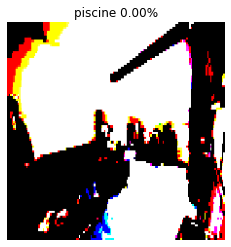

vacuum (7.21%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


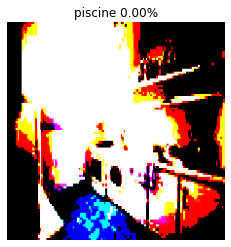

microwave (27.83%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


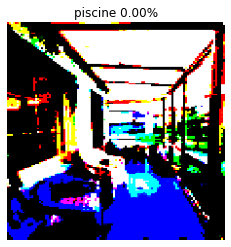

greenhouse (55.27%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


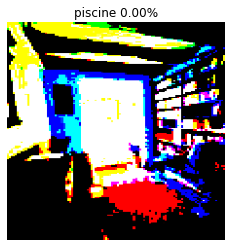

library (63.75%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


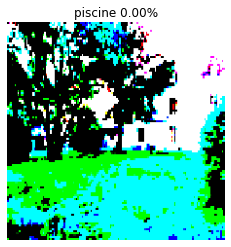

palace (19.11%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


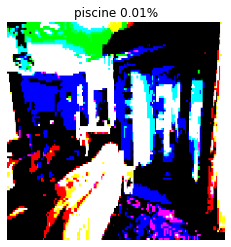

four-poster (22.67%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


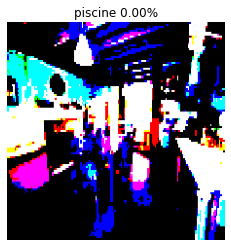

restaurant (90.74%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


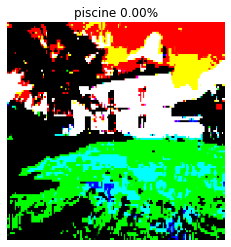

castle (35.49%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


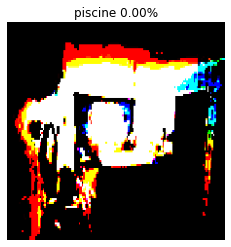

barber_chair (14.36%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


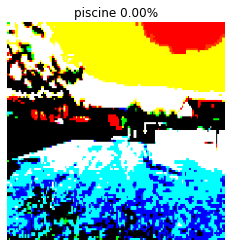

lakeside (32.43%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


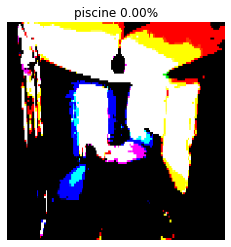

four-poster (83.58%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


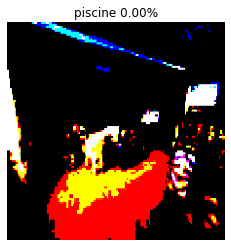

restaurant (10.55%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


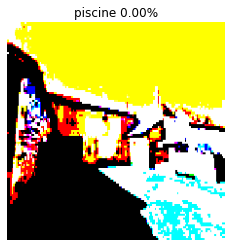

mobile_home (46.73%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


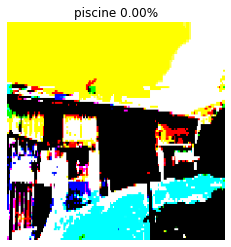

mobile_home (58.15%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


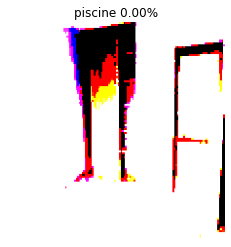

sliding_door (53.47%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


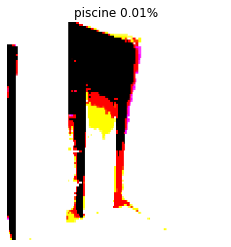

sliding_door (27.31%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


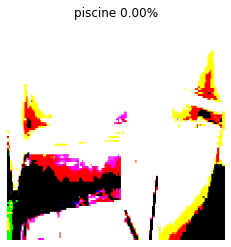

shower_curtain (49.38%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


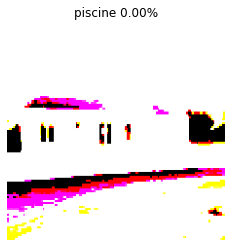

mobile_home (59.17%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


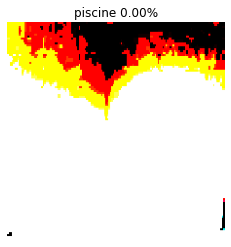

sliding_door (13.99%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


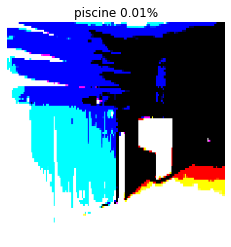

marimba (26.31%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


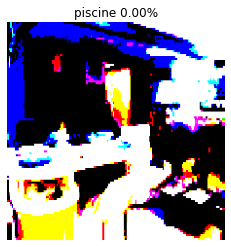

restaurant (56.87%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


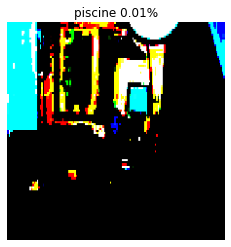

restaurant (14.11%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


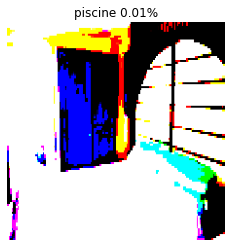

studio_couch (10.53%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


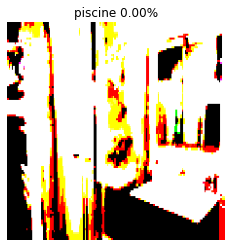

medicine_chest (62.50%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


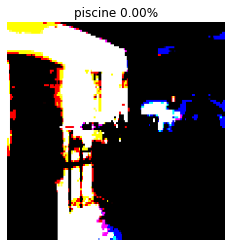

restaurant (30.96%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


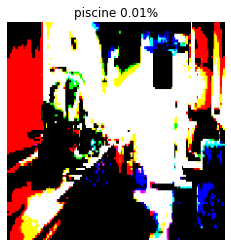

refrigerator (46.00%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


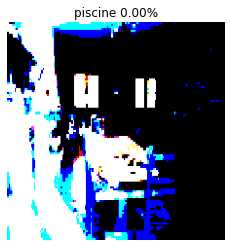

restaurant (57.55%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


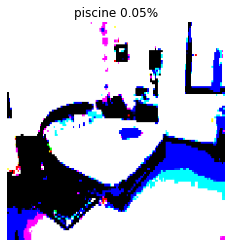

washbasin (16.87%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


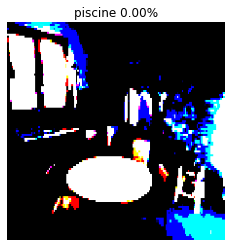

dining_table (49.49%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


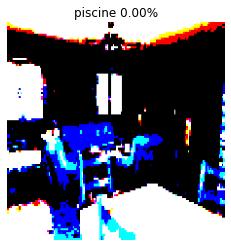

restaurant (64.06%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


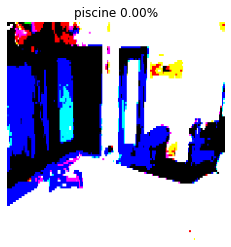

mosquito_net (35.85%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


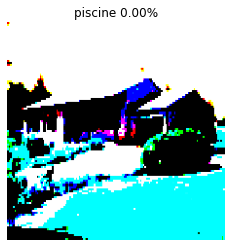

monastery (28.98%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


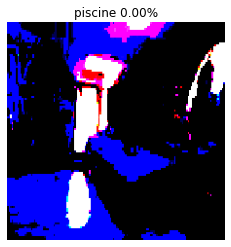

four-poster (47.94%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


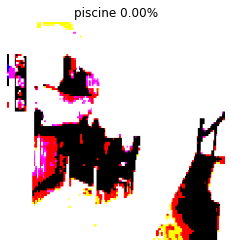

dining_table (25.78%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


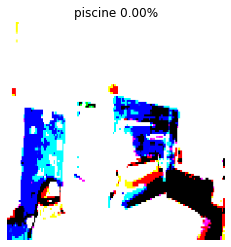

microwave (30.11%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


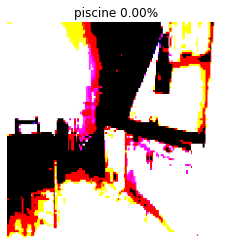

microwave (30.75%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


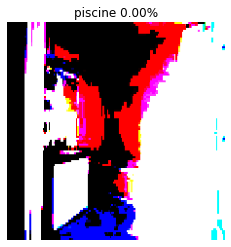

sliding_door (29.94%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


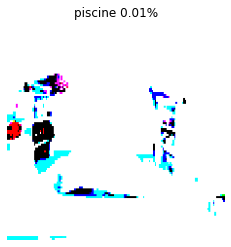

sewing_machine (14.67%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


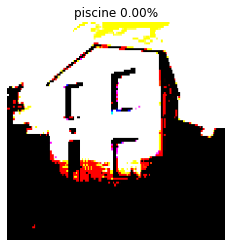

monastery (23.28%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


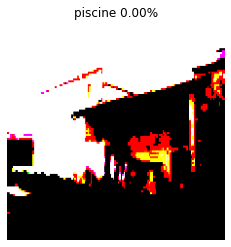

mobile_home (43.19%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


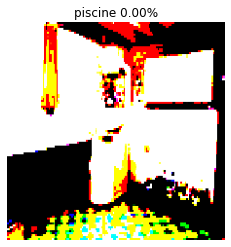

four-poster (26.31%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


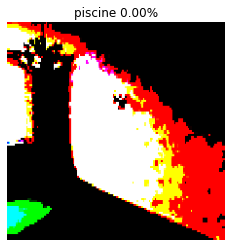

tub (25.48%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


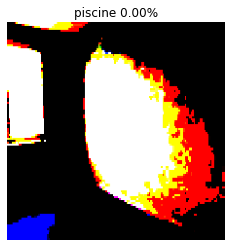

tub (9.26%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


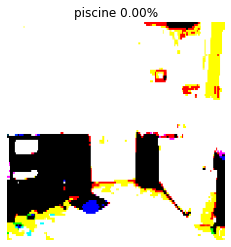

four-poster (17.73%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


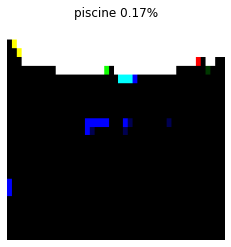

window_screen (15.85%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


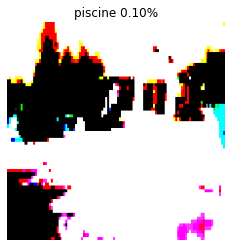

geyser (29.72%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


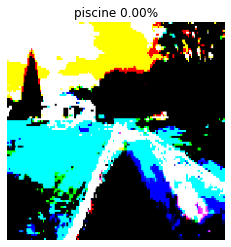

dam (23.69%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


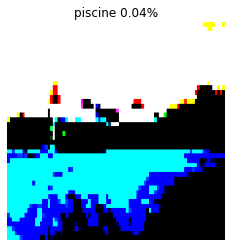

window_screen (47.57%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


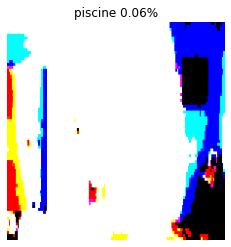

sliding_door (13.08%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


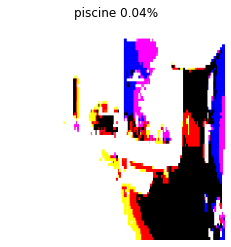

medicine_chest (14.39%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


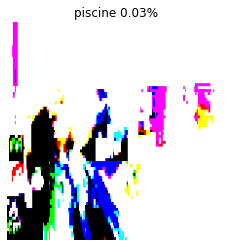

sliding_door (29.03%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


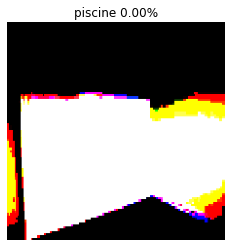

sliding_door (42.42%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


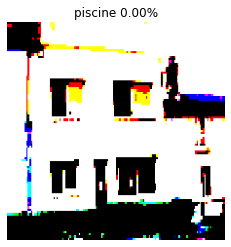

monastery (20.63%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


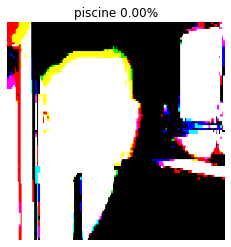

sliding_door (24.35%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


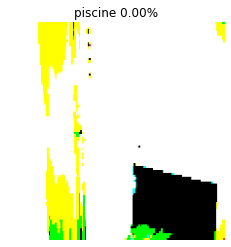

medicine_chest (23.50%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


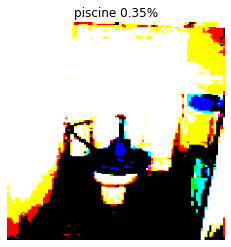

shower_curtain (14.33%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


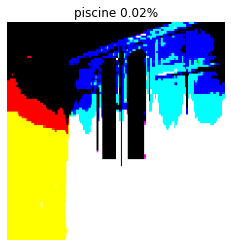

medicine_chest (12.52%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


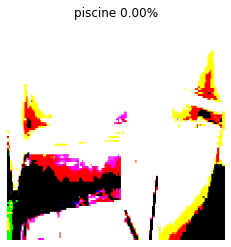

shower_curtain (49.38%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


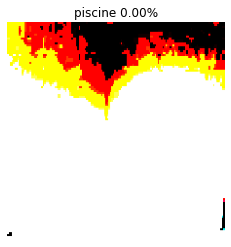

sliding_door (13.99%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


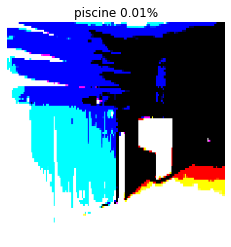

marimba (26.31%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


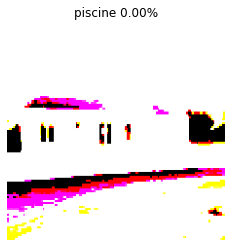

mobile_home (59.17%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


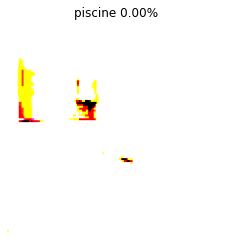

prison (18.33%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


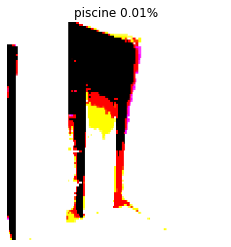

sliding_door (27.31%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


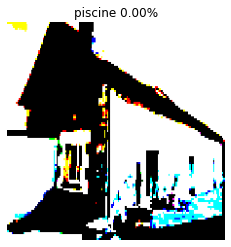

church (80.71%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


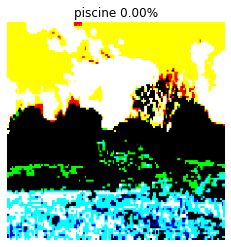

geyser (48.58%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


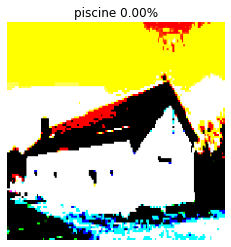

church (33.44%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


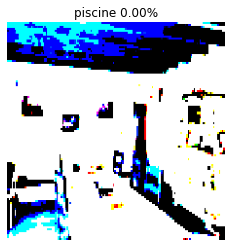

prison (41.87%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


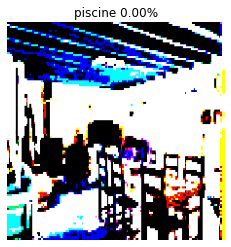

restaurant (47.78%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


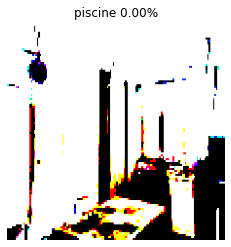

microwave (19.81%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


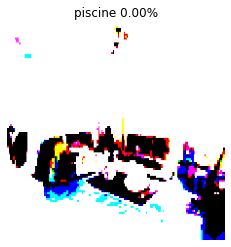

washer (18.44%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


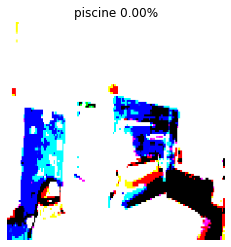

microwave (30.11%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


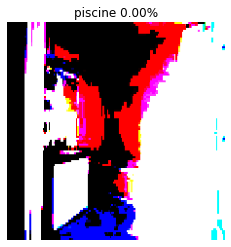

sliding_door (29.94%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


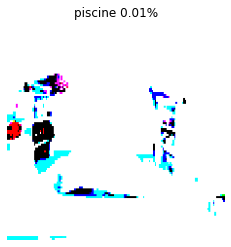

sewing_machine (14.67%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


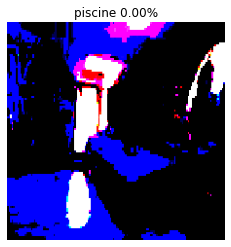

four-poster (47.94%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


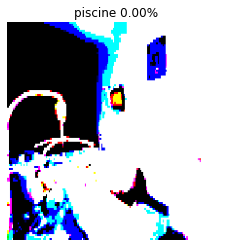

studio_couch (33.59%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


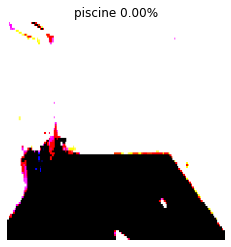

tub (22.01%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


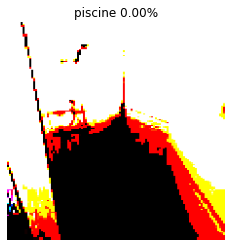

prison (23.68%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


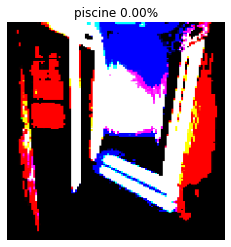

radiator (24.37%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


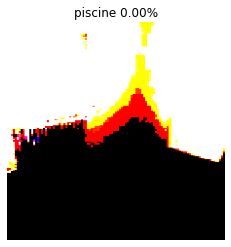

sliding_door (20.61%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


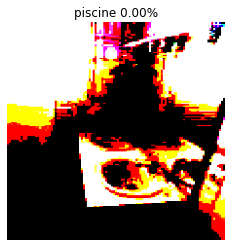

washbasin (25.15%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


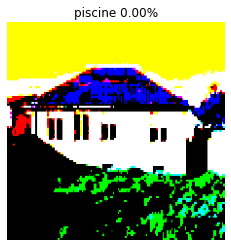

mobile_home (34.35%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


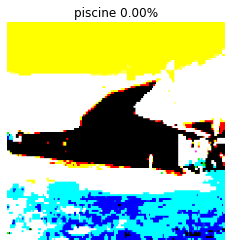

dam (19.29%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


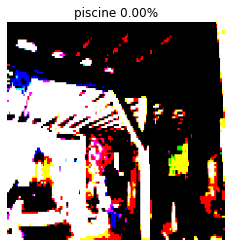

barbershop (39.05%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


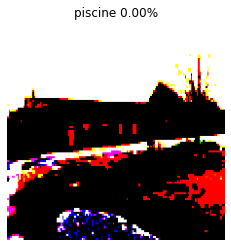

mobile_home (29.92%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


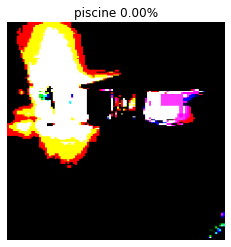

dining_table (25.23%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


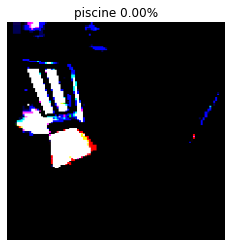

dining_table (17.78%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


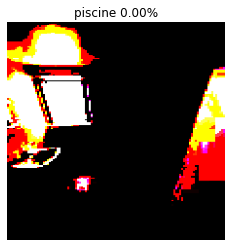

toilet_seat (44.26%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


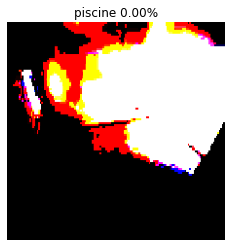

toilet_seat (13.58%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


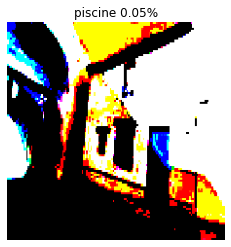

snowplow (16.97%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


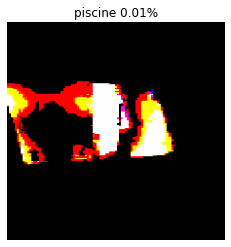

prison (19.86%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


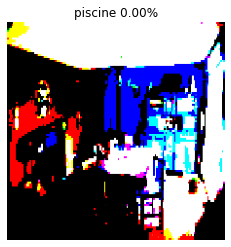

restaurant (74.95%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


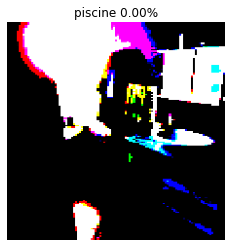

desk (14.88%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


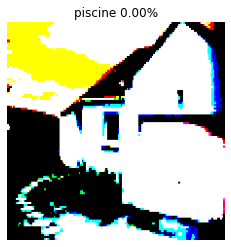

church (26.45%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


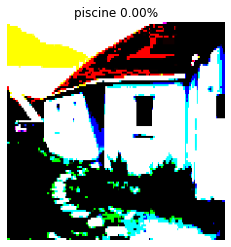

monastery (18.64%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


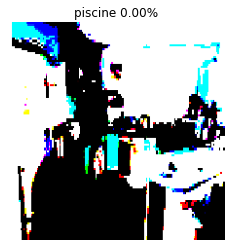

barber_chair (31.35%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


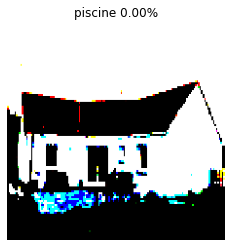

church (49.55%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


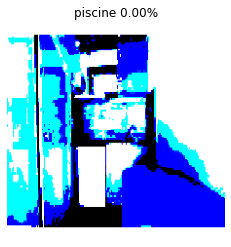

wardrobe (35.89%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


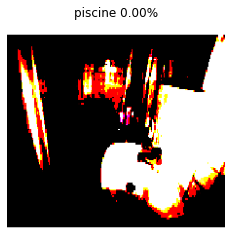

bathtub (31.55%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


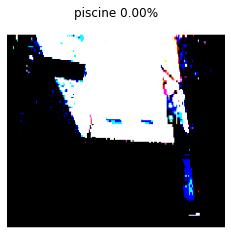

monastery (25.31%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


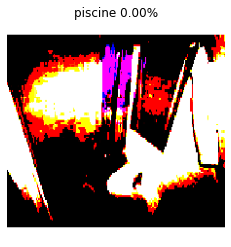

bannister (15.50%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


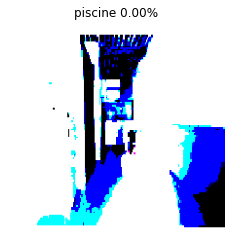

tub (23.00%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


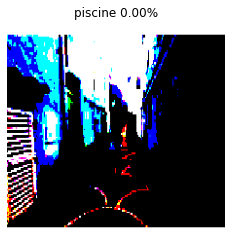

vault (7.43%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


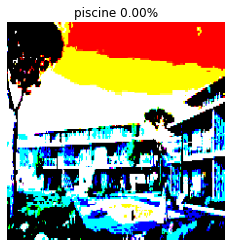

library (15.42%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


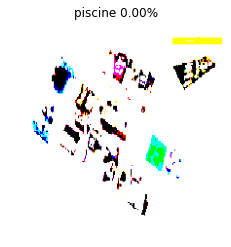

switch (27.78%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


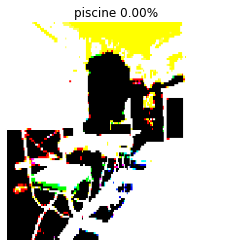

patio (49.41%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


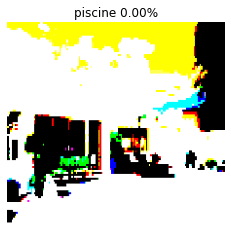

mobile_home (82.19%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


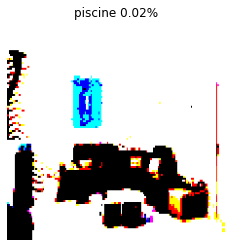

restaurant (9.67%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


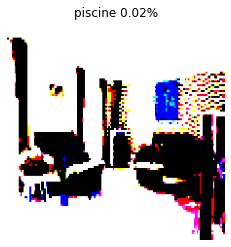

restaurant (11.04%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


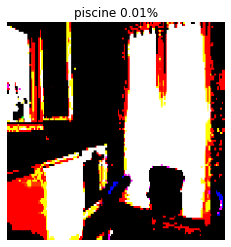

barbershop (14.25%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


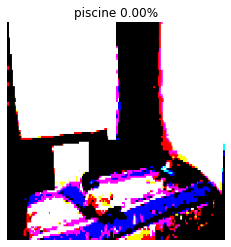

four-poster (19.67%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


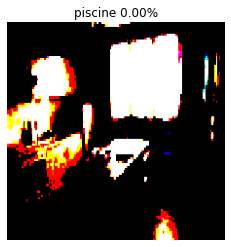

microwave (15.60%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


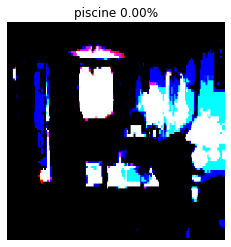

four-poster (56.24%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


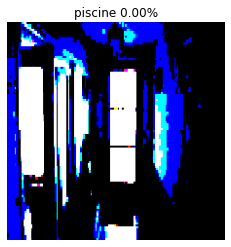

prison (20.90%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


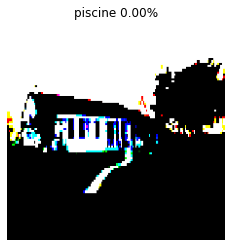

mobile_home (22.87%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


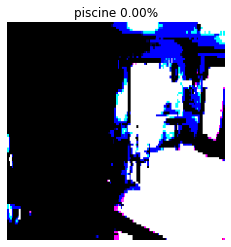

four-poster (47.30%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


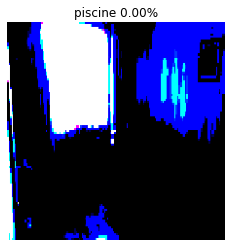

four-poster (17.20%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


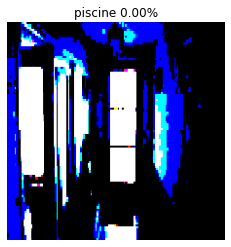

prison (20.90%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


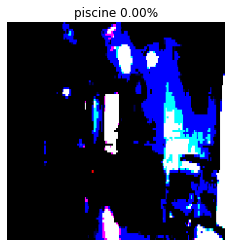

restaurant (56.54%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


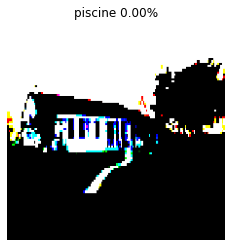

mobile_home (22.87%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


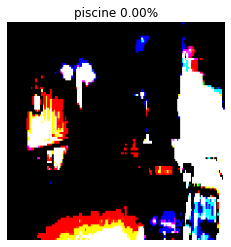

restaurant (40.80%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


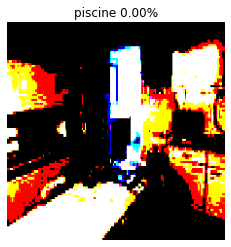

microwave (14.64%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


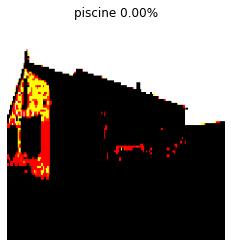

monastery (67.51%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


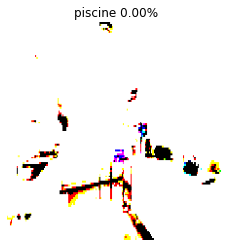

washer (18.03%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


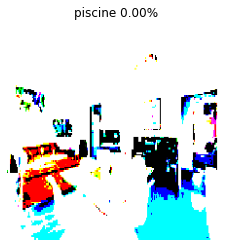

restaurant (77.62%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


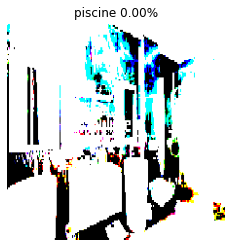

washbasin (21.08%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


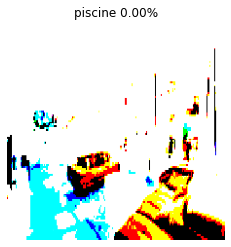

studio_couch (7.93%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


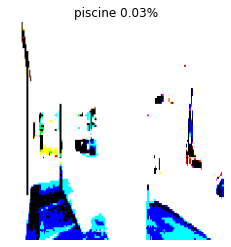

four-poster (14.71%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


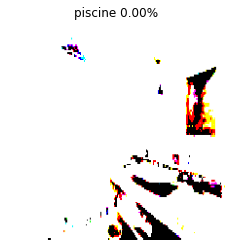

washbasin (7.83%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


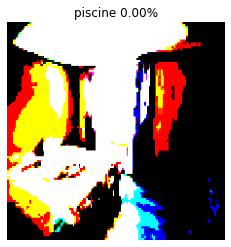

four-poster (22.33%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


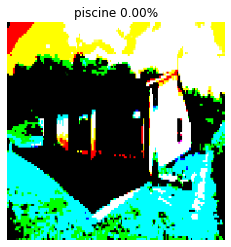

mobile_home (87.61%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


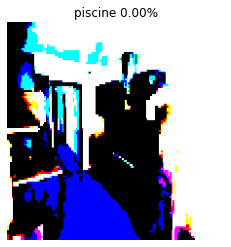

dining_table (22.52%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


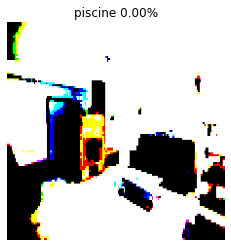

studio_couch (13.34%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


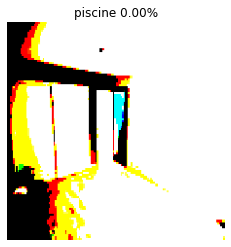

prison (52.53%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


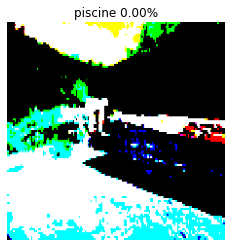

freight_car (19.03%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


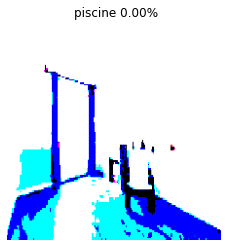

mosquito_net (69.40%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


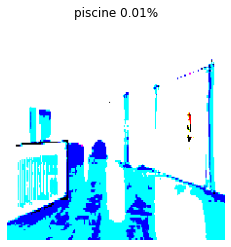

mosquito_net (18.39%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


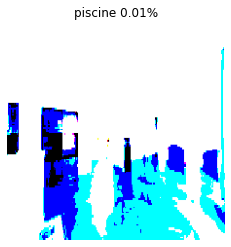

mosquito_net (31.95%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


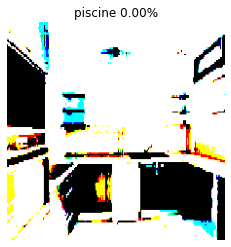

microwave (32.60%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


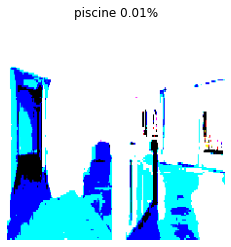

mosquito_net (45.76%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


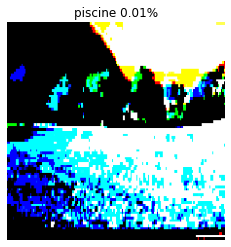

lakeside (23.19%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


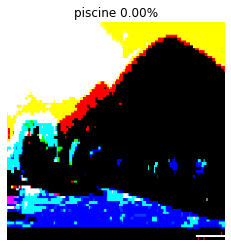

geyser (36.09%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


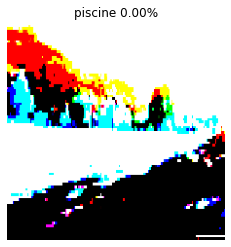

geyser (92.76%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


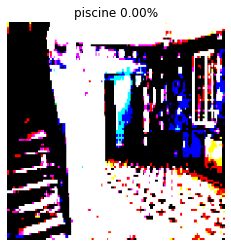

patio (10.88%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


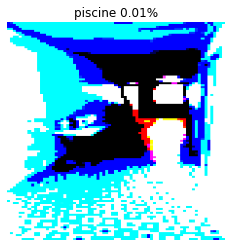

shoji (19.68%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


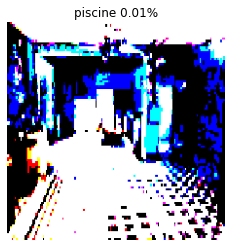

prison (15.94%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


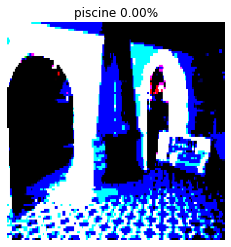

vault (62.82%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


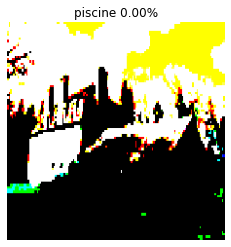

castle (28.93%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


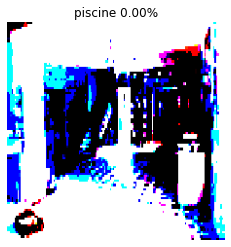

restaurant (12.76%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


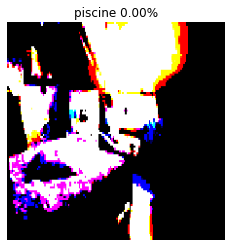

four-poster (40.46%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


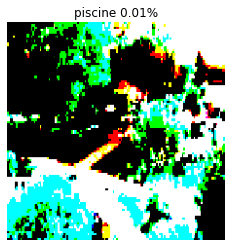

lakeside (20.57%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


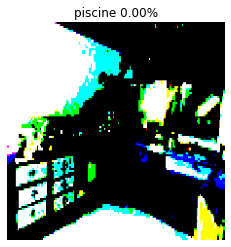

tobacco_shop (57.19%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


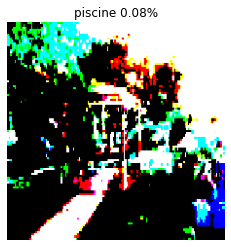

greenhouse (28.91%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


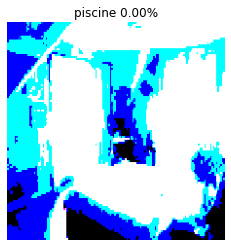

four-poster (86.19%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


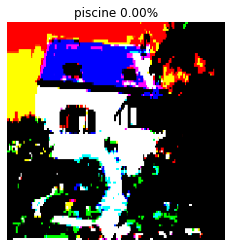

lakeside (27.25%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


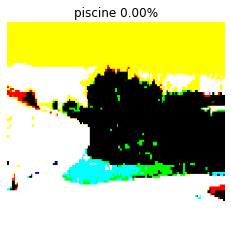

dam (52.98%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


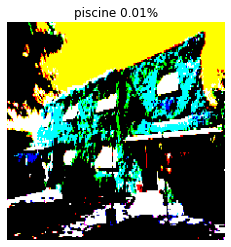

alp (16.06%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


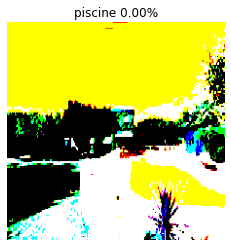

lakeside (40.86%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


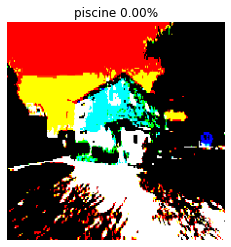

lakeside (14.20%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


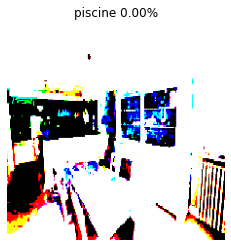

dining_table (12.59%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


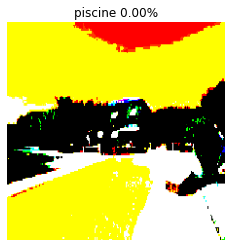

dam (56.25%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


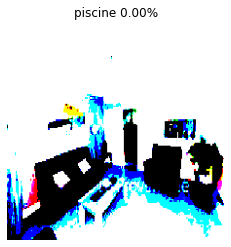

dining_table (35.83%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


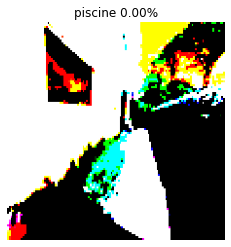

patio (23.24%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


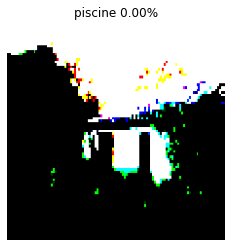

boathouse (31.63%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


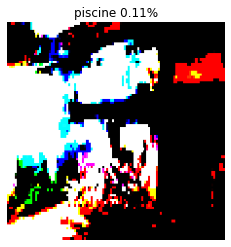

boathouse (7.72%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


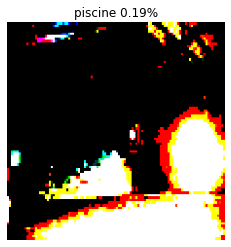

window_screen (8.37%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


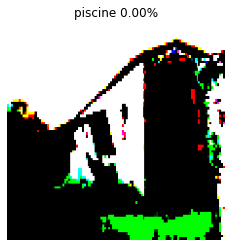

monastery (23.78%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


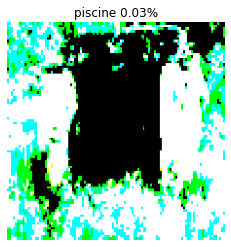

little_blue_heron (16.05%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


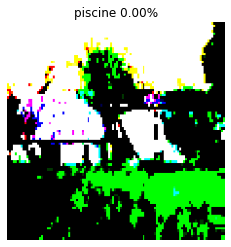

boathouse (83.76%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


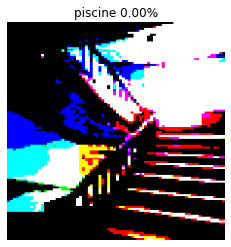

bannister (89.92%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


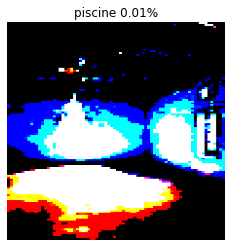

vault (24.76%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


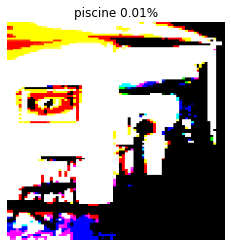

sliding_door (31.74%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


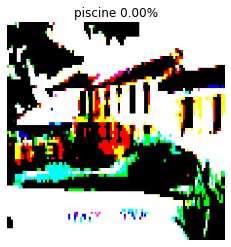

palace (75.15%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


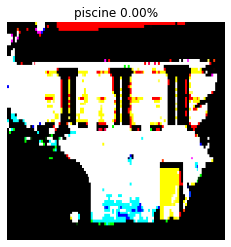

palace (35.28%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


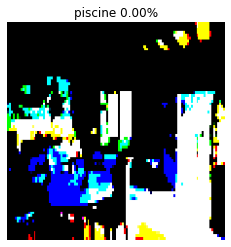

restaurant (51.21%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


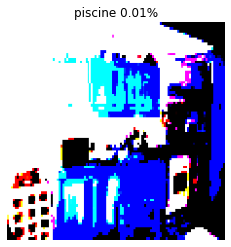

microwave (26.07%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


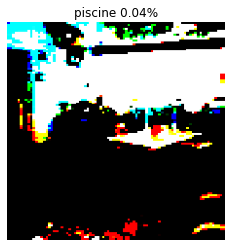

boathouse (20.14%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


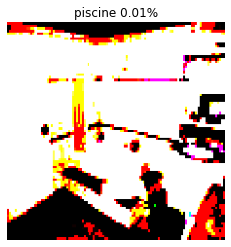

refrigerator (22.09%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


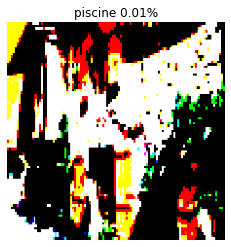

mosque (17.99%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


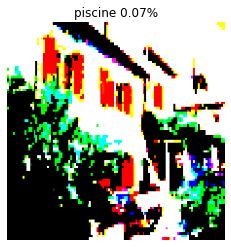

palace (23.62%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


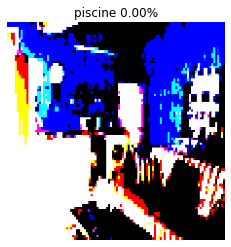

bakery (14.14%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


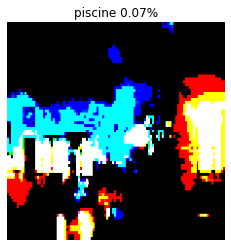

vault (17.43%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


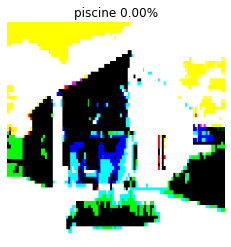

church (38.16%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


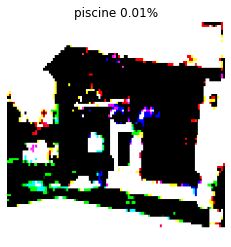

palace (64.30%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


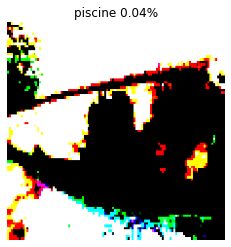

greenhouse (9.78%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


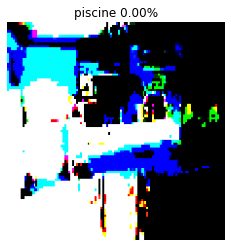

medicine_chest (81.12%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


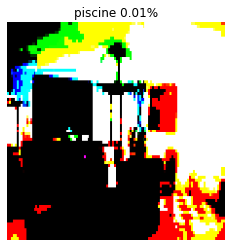

sliding_door (28.05%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


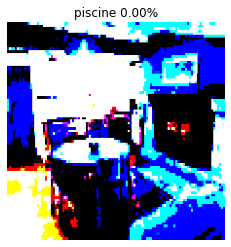

bakery (59.43%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


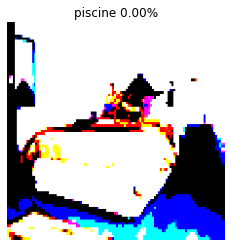

mosquito_net (45.64%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


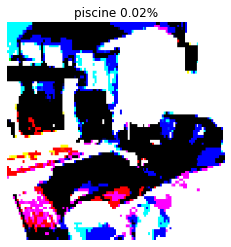

restaurant (12.52%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


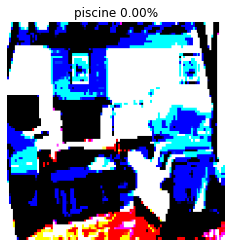

bakery (64.32%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


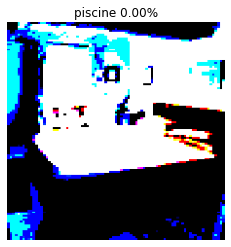

four-poster (56.69%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


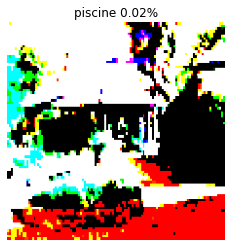

boathouse (48.09%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


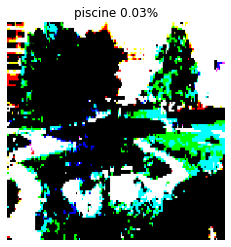

greenhouse (9.73%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


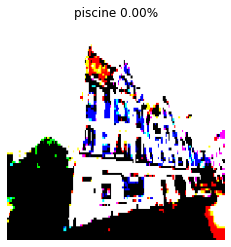

palace (26.58%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


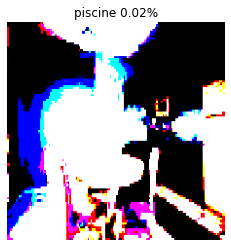

dining_table (12.50%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


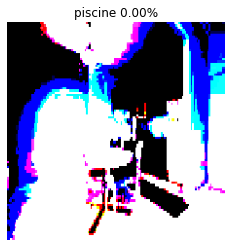

prison (13.37%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


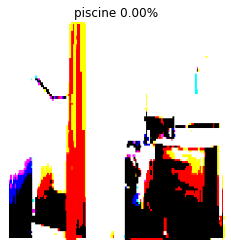

medicine_chest (61.61%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


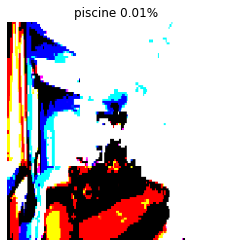

four-poster (26.49%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


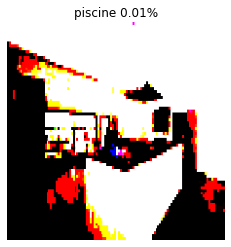

prison (36.65%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


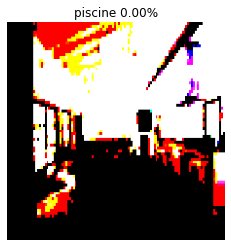

bannister (16.15%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


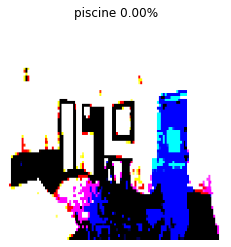

prison (18.69%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


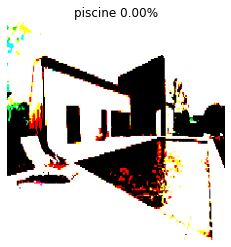

dam (64.23%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


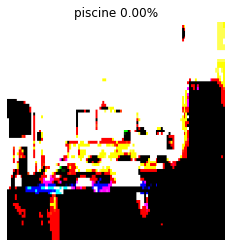

medicine_chest (17.70%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


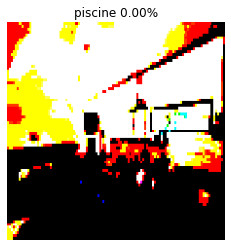

prison (45.99%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


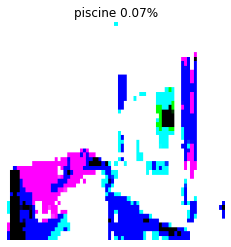

sliding_door (19.63%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


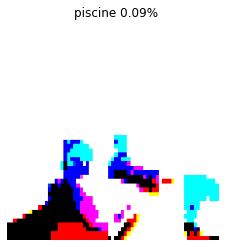

fireboat (64.72%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


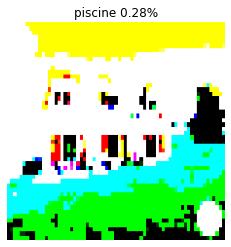

sliding_door (6.31%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


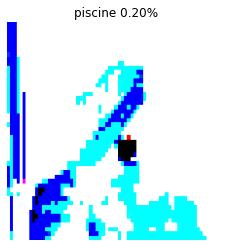

sliding_door (19.14%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


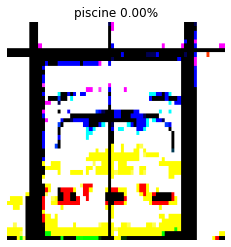

sliding_door (43.60%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


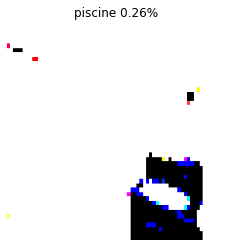

mosquito_net (13.42%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


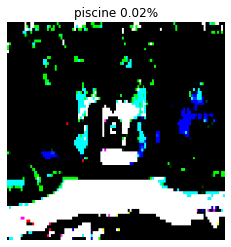

boathouse (22.13%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


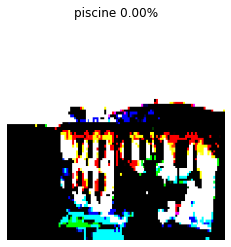

palace (56.99%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


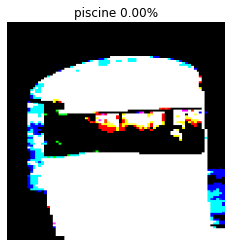

sliding_door (30.65%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


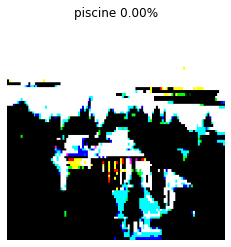

lakeside (28.01%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


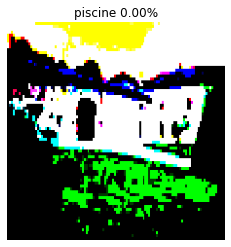

monastery (37.62%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


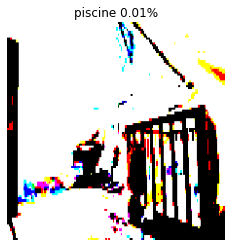

prison (14.73%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


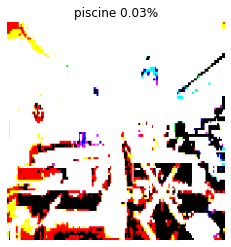

fireboat (20.69%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


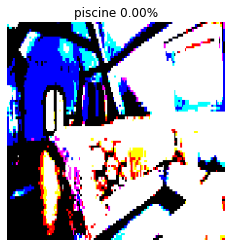

four-poster (39.43%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


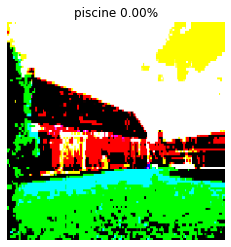

greenhouse (40.82%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


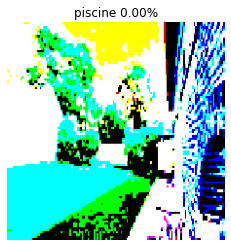

patio (33.76%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


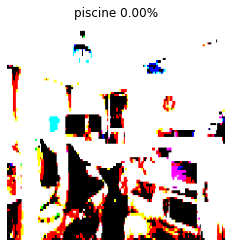

dining_table (11.93%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


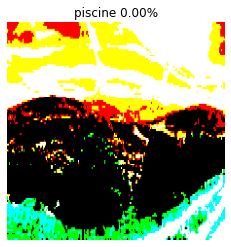

alp (68.90%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


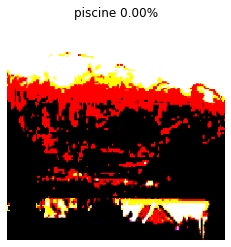

valley (12.34%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


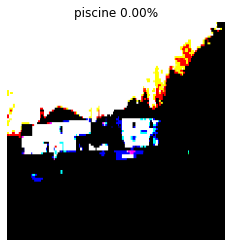

lakeside (13.19%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


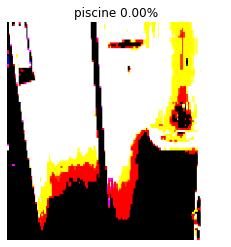

refrigerator (44.73%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


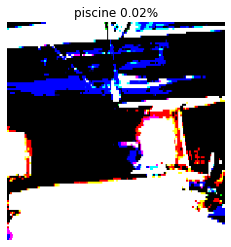

boathouse (12.54%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


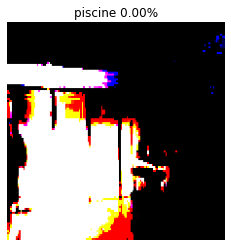

four-poster (34.73%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


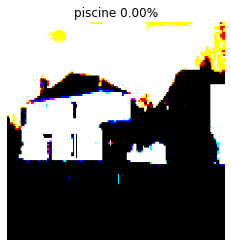

monastery (36.88%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


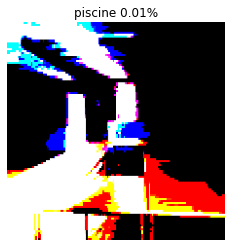

microwave (23.08%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


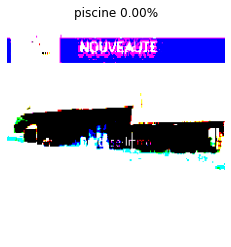

barn (30.74%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


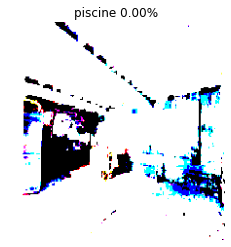

lumbermill (14.88%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


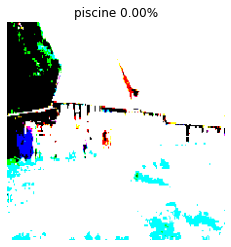

barn (88.02%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


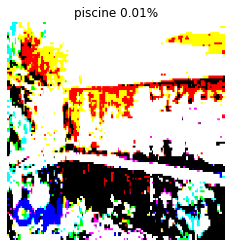

cliff (21.89%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


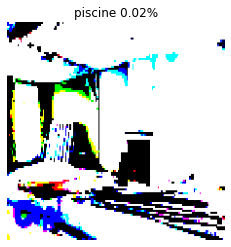

lumbermill (33.48%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


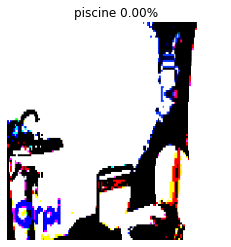

medicine_chest (22.12%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


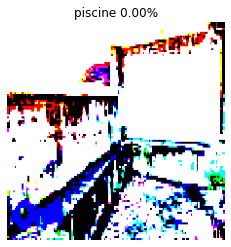

dam (58.14%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


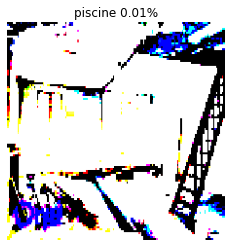

snowplow (23.61%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


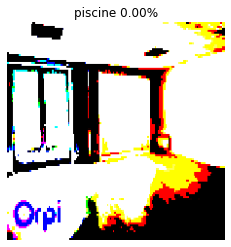

prison (47.53%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


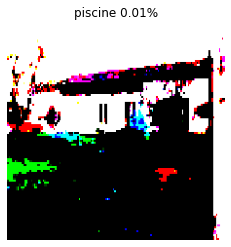

mobile_home (27.05%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


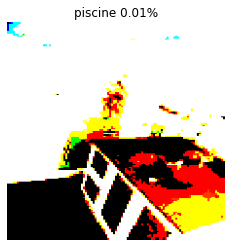

solar_dish (17.32%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


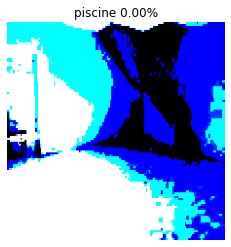

bannister (12.34%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


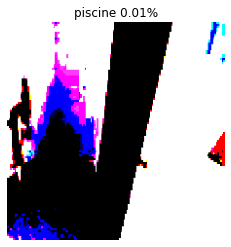

switch (9.74%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


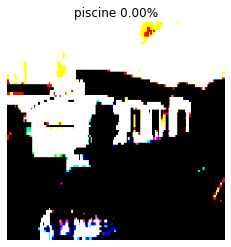

dam (19.26%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


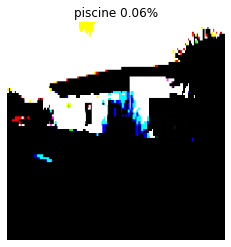

boathouse (30.92%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


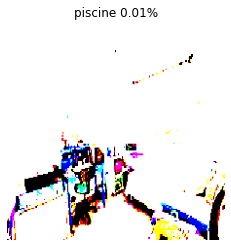

desk (16.47%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


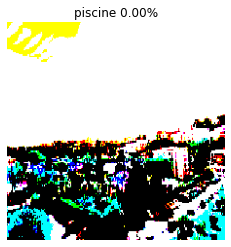

lakeside (21.50%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


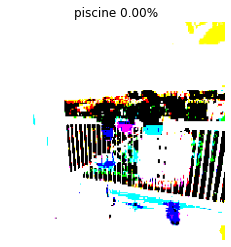

crib (23.98%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


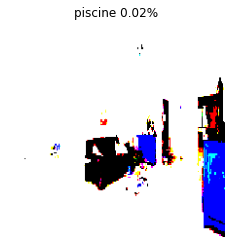

dining_table (21.56%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


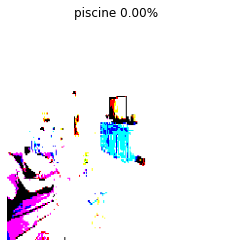

mosquito_net (23.09%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


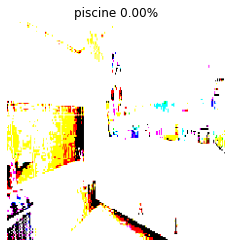

medicine_chest (24.10%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


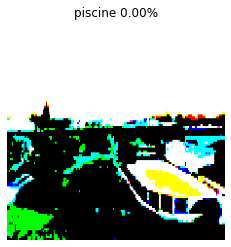

lakeside (78.87%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


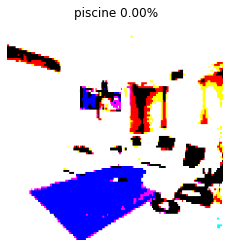

dining_table (24.87%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


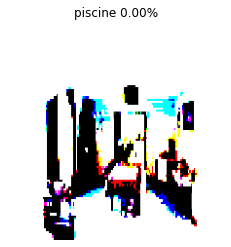

sliding_door (9.94%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


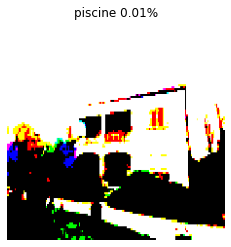

mobile_home (16.63%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


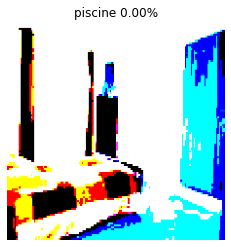

four-poster (50.57%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


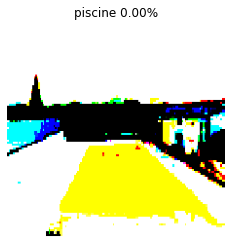

dam (64.00%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


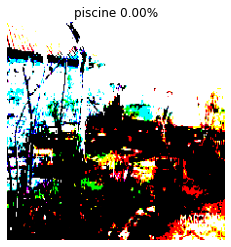

greenhouse (34.29%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


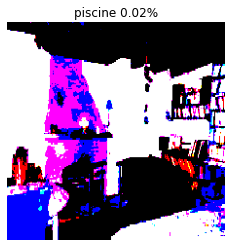

restaurant (38.93%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


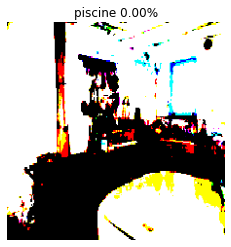

washbasin (16.77%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


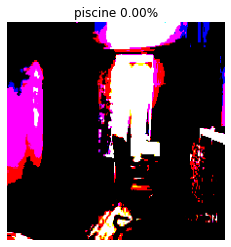

home_theater (21.25%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


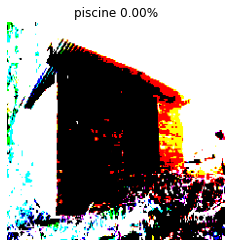

barn (36.00%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


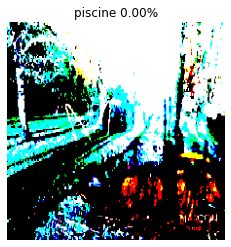

lakeside (15.40%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


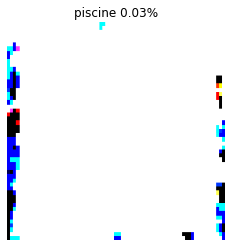

window_shade (61.55%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


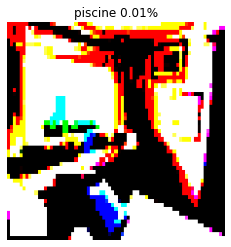

sliding_door (49.13%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


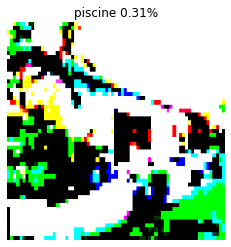

window_screen (11.86%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


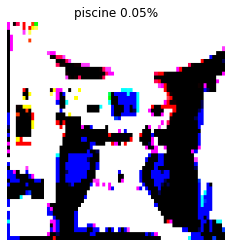

sliding_door (12.74%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


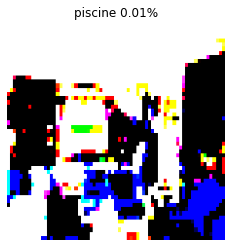

bookshop (50.18%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


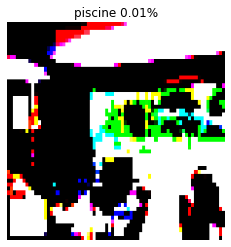

sliding_door (21.84%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


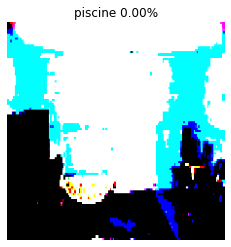

four-poster (34.83%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


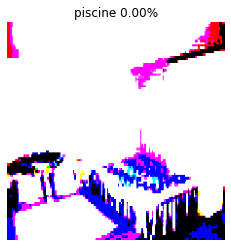

mosquito_net (49.46%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


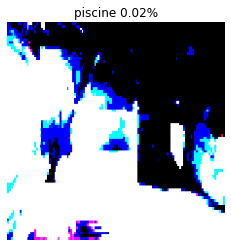

vault (40.69%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


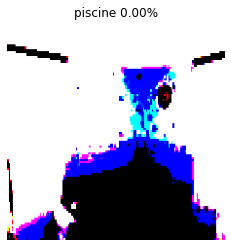

four-poster (16.78%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


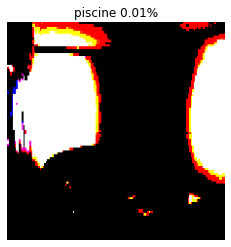

four-poster (14.96%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


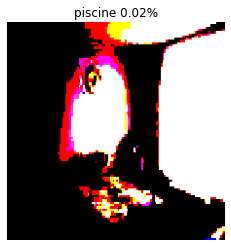

window_shade (16.74%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


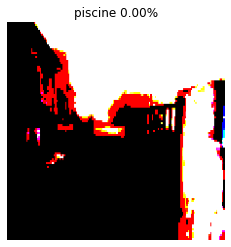

prison (74.78%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


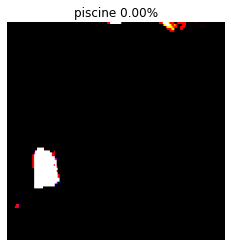

prison (46.52%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


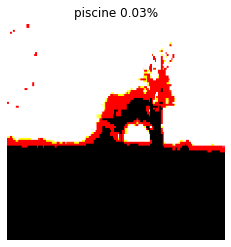

lakeside (10.46%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


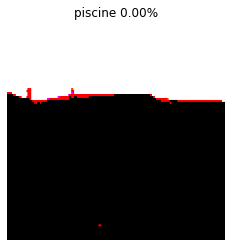

mobile_home (89.82%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


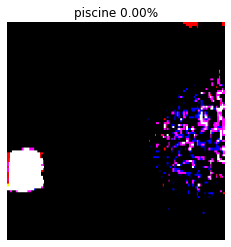

crib (38.97%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


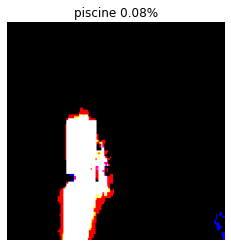

restaurant (7.40%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


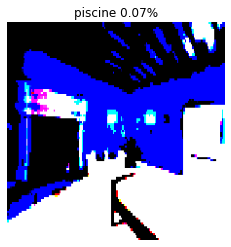

restaurant (29.90%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


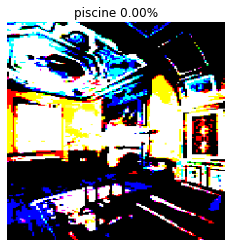

palace (18.51%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


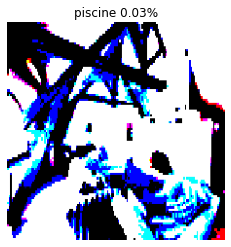

lab_coat (5.68%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


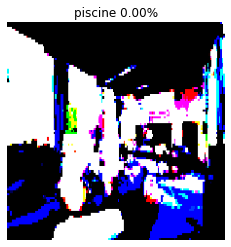

four-poster (65.49%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


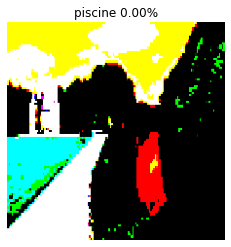

castle (20.41%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


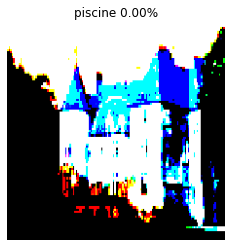

church (61.09%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


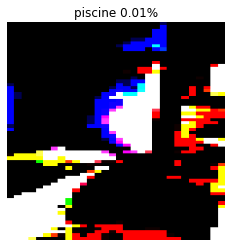

turnstile (17.10%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


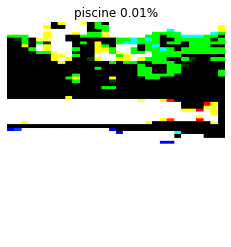

window_screen (44.19%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


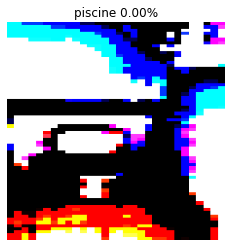

photocopier (12.90%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


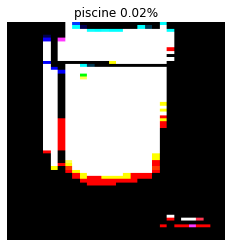

window_shade (32.49%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


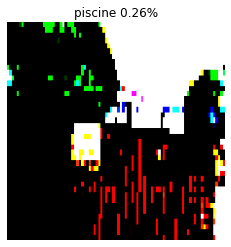

window_screen (30.87%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


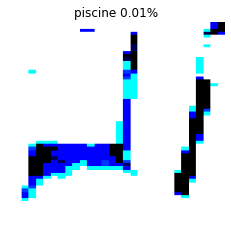

window_shade (32.46%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


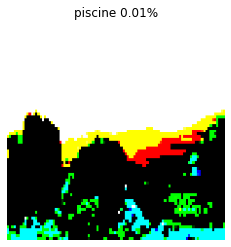

lakeside (48.77%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


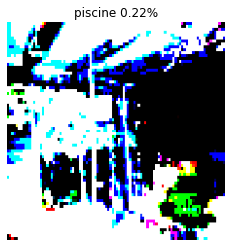

sliding_door (8.42%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


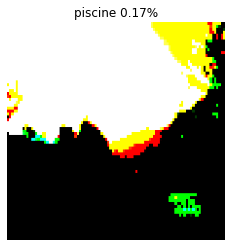

geyser (28.08%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


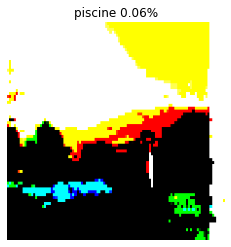

castle (9.21%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


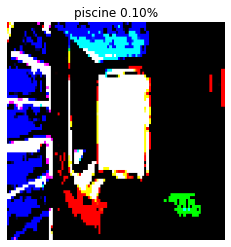

sliding_door (26.45%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


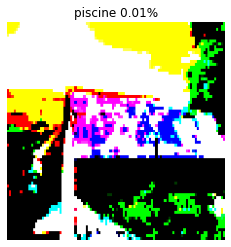

boathouse (35.34%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


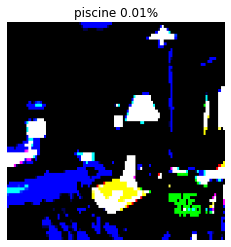

restaurant (67.47%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


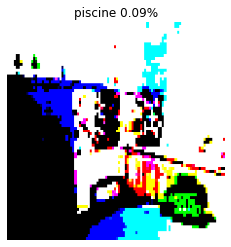

sliding_door (14.95%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


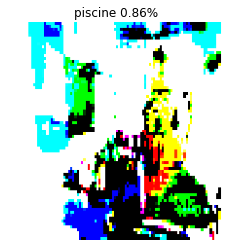

fountain (19.86%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


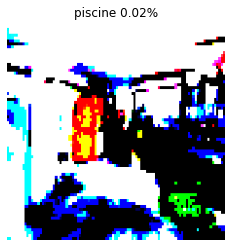

tobacco_shop (17.51%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


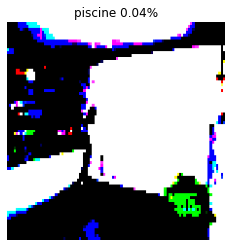

tobacco_shop (30.01%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


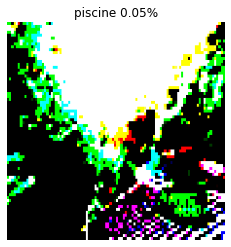

greenhouse (25.91%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


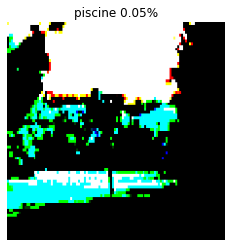

boathouse (45.39%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


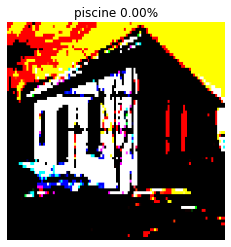

boathouse (76.31%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


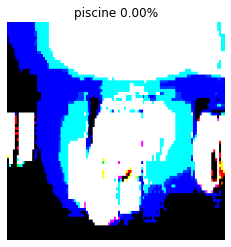

sliding_door (38.36%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


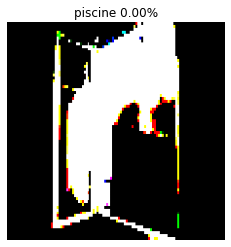

sliding_door (83.57%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


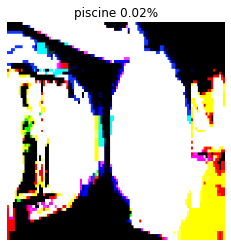

sliding_door (34.90%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


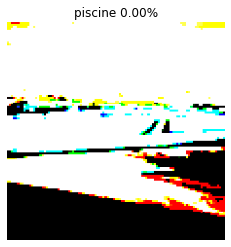

geyser (76.16%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


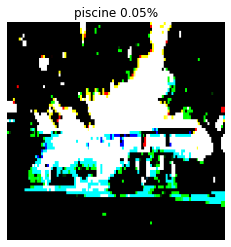

palace (19.43%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


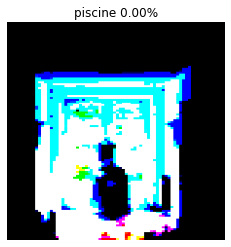

sliding_door (28.90%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


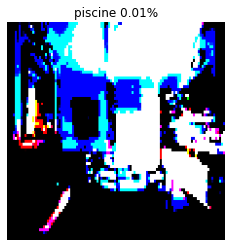

china_cabinet (34.11%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


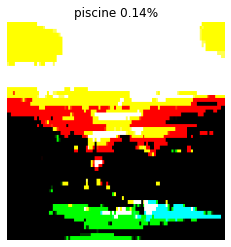

boathouse (20.80%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


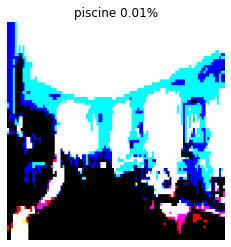

restaurant (20.30%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


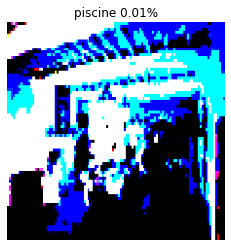

library (20.70%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


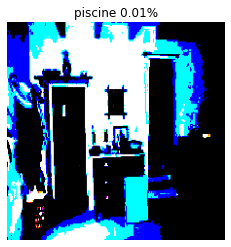

restaurant (17.02%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


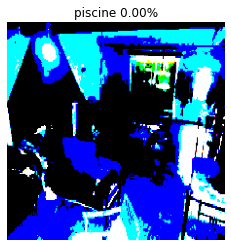

restaurant (64.13%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


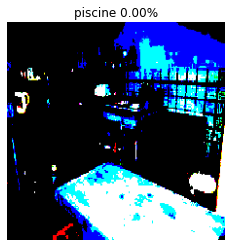

barber_chair (14.13%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


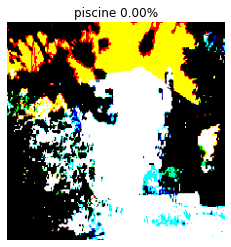

castle (24.78%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


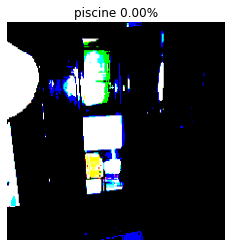

china_cabinet (61.84%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


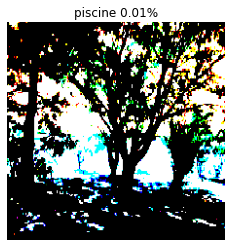

park_bench (10.35%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


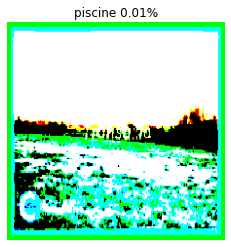

web_site (81.63%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


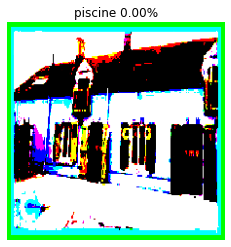

prison (21.93%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


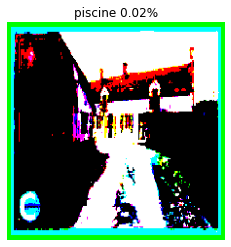

web_site (40.87%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


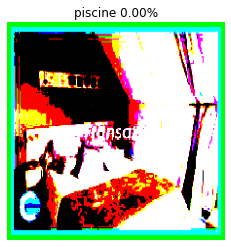

web_site (31.58%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


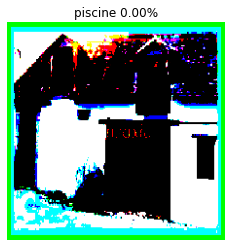

barn (18.67%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


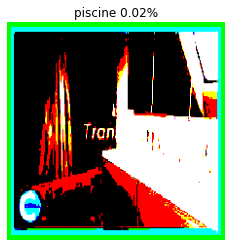

web_site (31.35%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


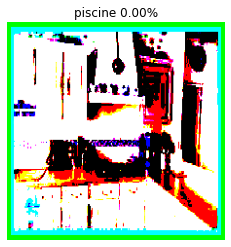

web_site (44.30%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


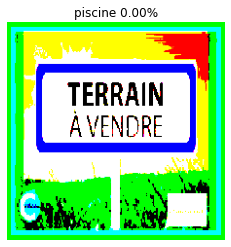

book_jacket (24.41%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


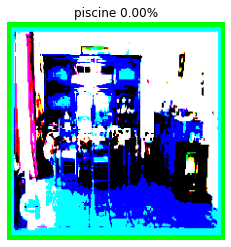

vending_machine (34.68%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


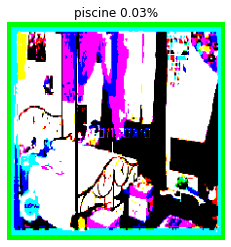

wardrobe (24.50%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


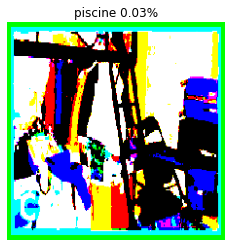

web_site (50.75%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


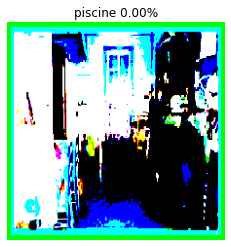

bookshop (44.32%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


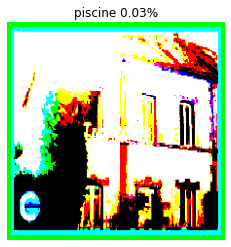

streetcar (45.16%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


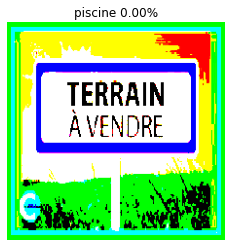

street_sign (22.68%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


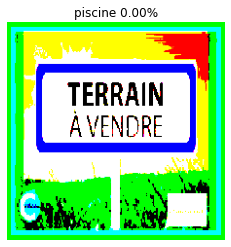

book_jacket (24.41%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


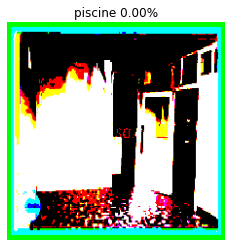

cash_machine (35.27%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


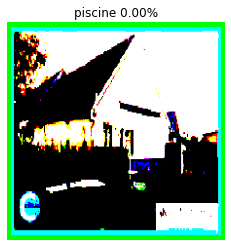

barn (90.66%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


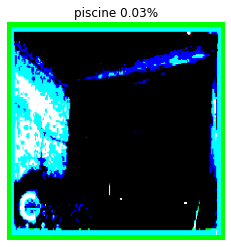

web_site (31.32%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


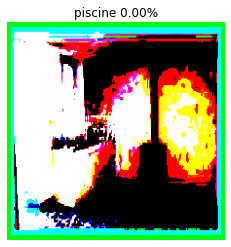

medicine_chest (38.38%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


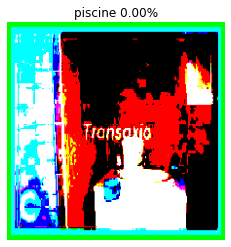

washbasin (49.96%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


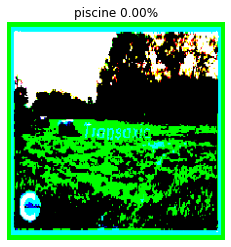

web_site (76.31%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


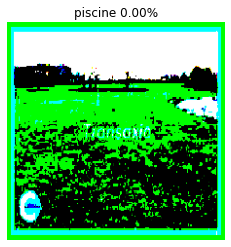

web_site (82.56%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


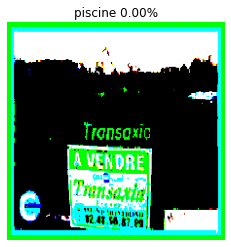

web_site (82.41%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


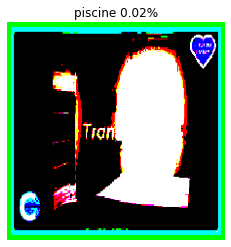

sliding_door (25.96%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


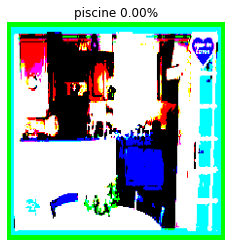

barbershop (32.19%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


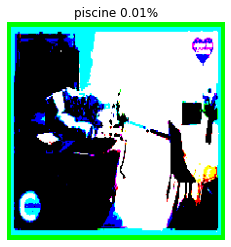

barbershop (57.24%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


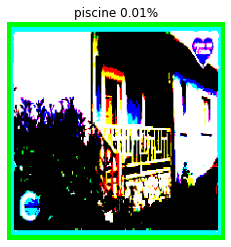

picket_fence (40.32%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


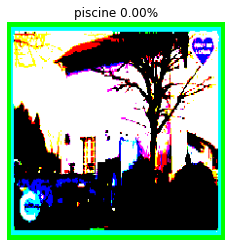

web_site (90.53%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


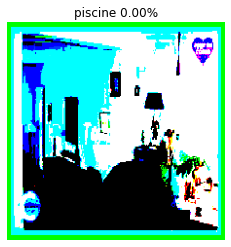

barbershop (50.00%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


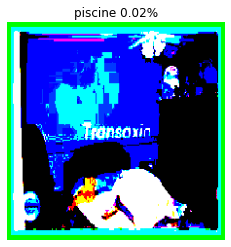

web_site (12.55%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


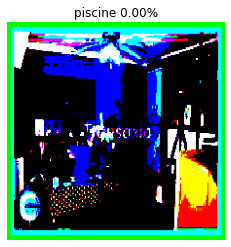

web_site (25.34%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


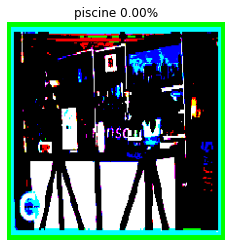

bookshop (49.12%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


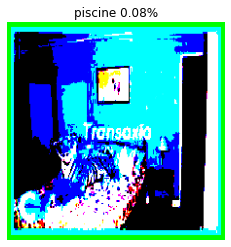

sliding_door (21.64%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


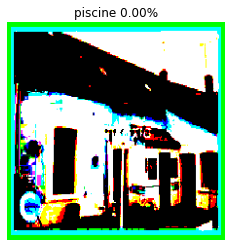

prison (24.35%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


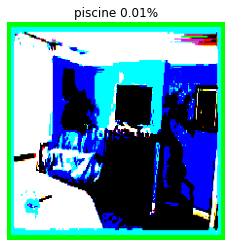

web_site (28.90%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


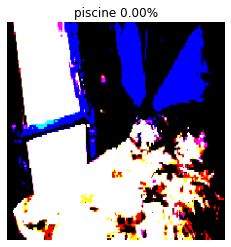

mosquito_net (44.62%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


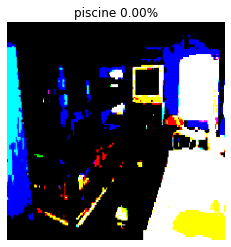

dining_table (22.16%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


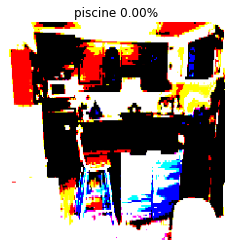

restaurant (21.17%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


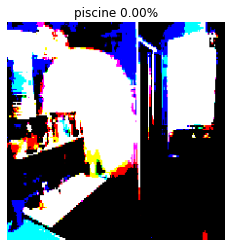

medicine_chest (59.10%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


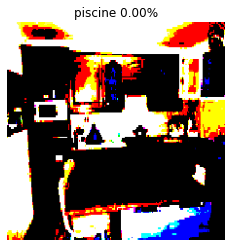

microwave (23.97%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


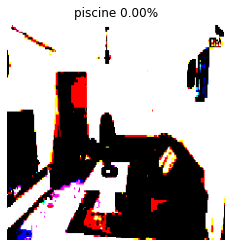

monastery (7.45%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


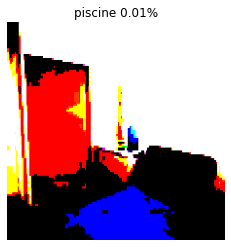

home_theater (15.33%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


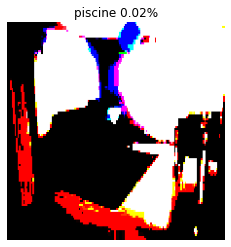

dining_table (32.19%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


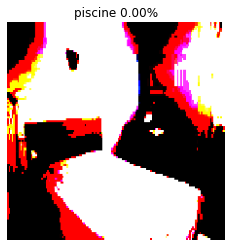

mosquito_net (51.01%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


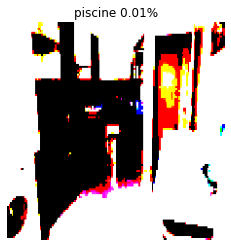

washer (19.48%)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


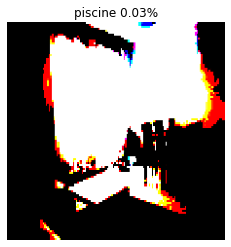

sliding_door (6.97%)


In [107]:
plt.figure(figsize=(5, 5))
for index, image in enumerate(test_iamges):
    for file in os.listdir(TEST_PATH + image+'/'):
        filename = TEST_PATH + image+'/'+file
        img = preprocess_imageVGG(filename)
        prediction = model.predict(img)
        #plt.subplot(5, 5, index+1)
        if prediction[0][0] > 0.5:
            plt.title('not piscine %.2f%%' % (100 - prediction[0][1]*100))
        else:
            plt.title('piscine %.2f%%' % (prediction[0][1]*100))

        plt.axis('off')
        plt.imshow(img[0])
        plt.show()
        label = decode_predictions(prediction)
# retrieve the most likely result, e.g. highest probability
        label = label[0][0]
# print the classification
        print('%s (%.2f%%)' % (label[1], label[2]*100))

In [ ]:
# Couche de sortie : classification => softmax sur le nombre de classe
classifier.add(
    Dense(
        units=2,
        activation='softmax',
        name='softmax'))



classifier = Sequential()
classifier(tf.keras.Input((150, 150, 3)))
# Réalisation des couches de Convolution  / Pooling

# ---- Conv / Pool N°1
classifier.add(Conv2D(filters=16,
                      kernel_size=3,
                      strides=1,
                      padding='same',
                      input_shape=(150, 150, 3),
                      activation='relu'))

classifier.add(BatchNormalization())
classifier.add(MaxPooling2D(pool_size=(2, 2), strides=2))

# ---- Conv / Pool N°2
classifier.add(Conv2D(filters=16,
                      kernel_size=3,
                      strides=1,
                      padding='same',
                      activation='relu'))

classifier.add(BatchNormalization())
classifier.add(MaxPooling2D(pool_size=(2, 2), strides=2))
classifier.add(Dropout(0.1))
# ---- Conv / Pool N°3
classifier.add(Conv2D(filters=32,
                      kernel_size=3,
                      strides=1,
                      padding='same',
                      activation='relu'))

classifier.add(BatchNormalization())
classifier.add(MaxPooling2D(pool_size=(2, 2), strides=2))

# ---- Conv / Pool N°4
classifier.add(Conv2D(filters=32,
                      kernel_size=3,
                      strides=1,
                      padding='same',
                      activation='relu'))

classifier.add(BatchNormalization())

classifier.add(MaxPooling2D(pool_size=(2, 2), strides=2))


# Fully Connected
# Flattening : passage de matrices 3D vers un vecteur
classifier.add(Flatten())
classifier.add(Dense(512, activation='relu'))
classifier.add(Dropout(0.1))


# Couche de sortie : classification => softmax sur le nombre de classe
classifier.add(
    Dense(
        units=2,
        activation='softmax',
        name='softmax'))

# compilation du  model de classification
classifier.compile(
    optimizer=OPTIMIZER,
    loss='categorical_crossentropy',
    metrics=['accuracy'])


#print("Input Shape :{}".format(classifier.get_input_shape_at(0)))
classifier.summary()




In [53]:
# Initialisation du modèle
classifier2 = Sequential()
classifier2(tf.keras.Input((150, 150, 3)))
# Réalisation des couches de Convolution  / Pooling
classifier2.add(RandomFlip("horizontal_and_vertical"))
classifier2.add(RandomRotation(0.2))
# ---- Conv / Pool N°1
classifier2.add(Conv2D(filters=16,
                      kernel_size=3,
                      strides=1,
                      padding='same',
                      input_shape=(150, 150, 3),
                      activation='relu'))

classifier2.add(BatchNormalization())
classifier2.add(MaxPooling2D(pool_size=(2, 2), strides=2))
classifier2.add(Dropout(0.1))
# ---- Conv / Pool N°2
classifier2.add(Conv2D(filters=16,
                      kernel_size=3,
                      strides=1,
                      padding='same',
                      activation='relu'))

classifier2.add(BatchNormalization())
classifier2.add(MaxPooling2D(pool_size=(2, 2), strides=2))

# ---- Conv / Pool N°3
classifier2.add(Conv2D(filters=32,
                      kernel_size=3,
                      strides=1,
                      padding='same',
                      activation='relu'))

classifier2.add(BatchNormalization())
classifier2.add(MaxPooling2D(pool_size=(2, 2), strides=2))

# Fully Connected
# Flattening : passage de matrices 3D vers un vecteur
classifier2.add(Flatten())

# Couche de sortie : classification => softmax sur le nombre de classe
classifier2.add(
    Dense(
        units=2,
        activation='softmax',
        name='softmax'))

# compilation du  model de classification
classifier2.compile(
    optimizer=OPTIMIZER,
    loss='categorical_crossentropy',
    metrics=['accuracy'])


#print("Input Shape :{}".format(classifier.get_input_shape_at(0)))
classifier2.summary()



NameError: name 'RandomFlip' is not defined

In [28]:
history = classifier.fit(train_ds, epochs=10, validation_data=val_ds)

Epoch 1/10


ValueError: Creating variables on a non-first call to a function decorated with tf.function.

In [33]:
history = classifier2.fit(train_ds, epochs=20, validation_data=val_ds)

Epoch 1/20
6/6 [==============================] - 3s 460ms/step - loss: 0.0280 - accuracy: 0.9814 - val_loss: 3.2710 - val_accuracy: 0.6750
Epoch 2/20
6/6 [==============================] - 2s 353ms/step - loss: 0.0095 - accuracy: 1.0000 - val_loss: 2.5154 - val_accuracy: 0.7000
Epoch 3/20
6/6 [==============================] - 2s 358ms/step - loss: 0.0089 - accuracy: 1.0000 - val_loss: 1.9519 - val_accuracy: 0.7500
Epoch 4/20
6/6 [==============================] - 2s 358ms/step - loss: 0.0247 - accuracy: 0.9938 - val_loss: 1.8140 - val_accuracy: 0.7750
Epoch 5/20
6/6 [==============================] - 2s 361ms/step - loss: 0.0088 - accuracy: 1.0000 - val_loss: 1.7206 - val_accuracy: 0.7750
Epoch 6/20
6/6 [==============================] - 2s 361ms/step - loss: 0.0089 - accuracy: 1.0000 - val_loss: 1.5775 - val_accuracy: 0.8000
Epoch 7/20
6/6 [==============================] - 3s 408ms/step - loss: 0.0073 - accuracy: 1.0000 - val_loss: 1.3794 - val_accuracy: 0.8000
Epoch 8/20
6/6 [====

KeyError: 'auc'

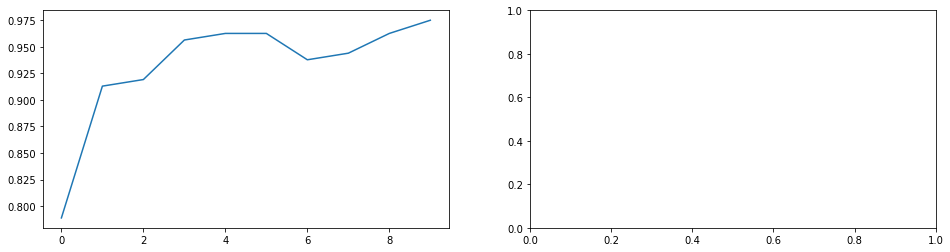

In [32]:
#fig, axs = plt.subplots(1, 2, figsize=(16, 4))
#
#axs[0].plot(history.history["accuracy"], label="accuracy")
#axs[0].plot(history.history["auc"], label="auc")
#
#axs[0].plot(history.history["val_accuracy"], label="val_accuracy")
#axs[0].plot(history.history["val_auc"], label="val_auc")
#
#axs[0].set_title("Metrics over epochs")
#axs[0].set_xlabel("epochs")
#
#axs[0].legend(bbox_to_anchor=(1.05, 1), loc='upper left', frameon=False)
#
#axs[1].plot(history.history["loss"], label="loss")
#axs[1].plot(history.history["val_loss"], label="val_loss")
#
#axs[1].set_title("Loss over epochs")
#axs[1].set_xlabel("epochs")
#axs[1].legend(bbox_to_anchor=(1.05, 1), loc='upper left', frameon=False)
#
#fig.tight_layout()
#plt.show()

In [44]:
pred=classifier.predict(train_ds)
pred

array([[1.36456311e-01, 8.63543749e-01],
       [4.68523474e-04, 9.99531507e-01],
       [8.55319083e-01, 1.44680902e-01],
       [9.02442694e-01, 9.75573584e-02],
       [5.18002249e-02, 9.48199809e-01],
       [4.03030426e-05, 9.99959707e-01],
       [6.33979507e-04, 9.99365985e-01],
       [1.64679587e-02, 9.83532071e-01],
       [1.57405753e-02, 9.84259427e-01],
       [9.03496239e-03, 9.90965009e-01],
       [3.19344076e-06, 9.99996781e-01],
       [1.17751893e-04, 9.99882221e-01],
       [2.62650588e-07, 9.99999762e-01],
       [1.54609090e-08, 1.00000000e+00],
       [1.49622144e-06, 9.99998450e-01],
       [1.63279083e-02, 9.83672082e-01],
       [8.83712526e-03, 9.91162896e-01],
       [1.19975507e-02, 9.88002419e-01],
       [3.11237550e-03, 9.96887624e-01],
       [2.11862708e-03, 9.97881353e-01],
       [7.04466738e-03, 9.92955387e-01],
       [9.64702889e-02, 9.03529644e-01],
       [3.25815892e-03, 9.96741831e-01],
       [2.08204284e-01, 7.91795671e-01],
       [7.794803

In [52]:
images.shape[0]
if labels[i][0].numpy()==0.0:
            plt.title("Piscine : 0")
        else:
            plt.title("Pas Piscine : 1")

32

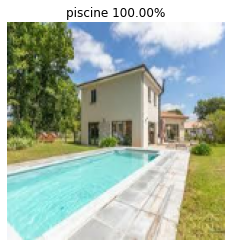

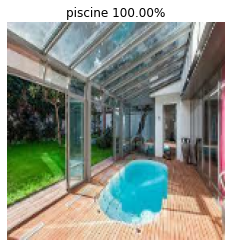

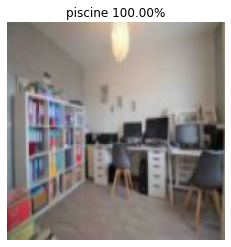

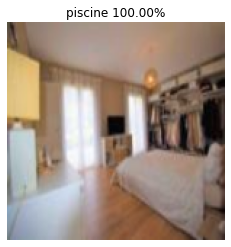

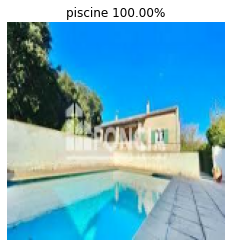

...

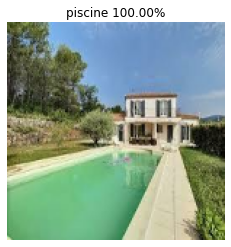

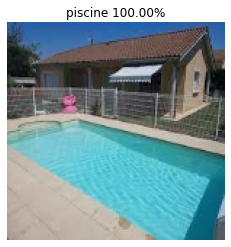

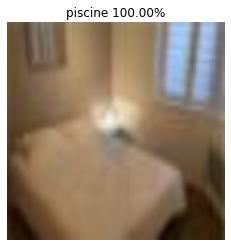

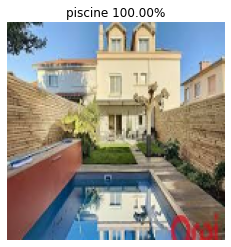

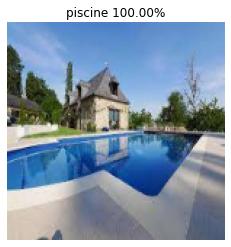

In [35]:
i=0
for images, labels in train_ds.take(1):
    for num in range(images.shape[0]):
        #img = pre
        prediction = classifier.predict(images)
        if prediction[i][0] > 0.5:
            plt.title('not piscine %.2f%% / %.1f%' % (prediction[0][1]*100,labels[num][0].numpy()))
        else:
            plt.title('piscine %.2f%%' % (prediction[0][1]*100))

        plt.axis('off')
        plt.imshow(images[num].numpy().astype("uint8"))
        plt.show()
        i+=1


In [49]:
import os
test_iamges  = os.listdir(TEST_PATH)

from keras.preprocessing.image import load_img, img_to_array


def preprocess_image(img_path):
    img = load_img(img_path, target_size=image_size)
    img_tensor = img_to_array(img) 
    # change it to shape [1, 150, 150, 3]
    img_tensor = np.expand_dims(img_tensor, axis=0)
    img_tensor /= 255.
    return img_tensor


plt.figure(figsize=(5, 5))
for index, image in enumerate(test_iamges):
    for file in os.listdir(TEST_PATH + image+'/'):
        filename = TEST_PATH + image+'/'+file
        img = preprocess_image(filename)
        prediction = classifier.predict(img)
        #plt.subplot(5, 5, index+1)
        if prediction[0][0] > 0.5:
            plt.title('not piscine %.2f%%' % (100 - prediction[0][1]*100))
        else:
            plt.title('piscine %.2f%%' % (prediction[0][1]*100))

        plt.axis('off')
        plt.imshow(img[0])
        plt.show()

ValueError: in user code:

    File "C:\Users\steve\AppData\Roaming\Python\Python38\site-packages\keras\engine\training.py", line 1621, in predict_function  *
        return step_function(self, iterator)
    File "C:\Users\steve\AppData\Roaming\Python\Python38\site-packages\keras\engine\training.py", line 1611, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "C:\Users\steve\AppData\Roaming\Python\Python38\site-packages\keras\engine\training.py", line 1604, in run_step  **
        outputs = model.predict_step(data)
    File "C:\Users\steve\AppData\Roaming\Python\Python38\site-packages\keras\engine\training.py", line 1572, in predict_step
        return self(x, training=False)
    File "C:\Users\steve\AppData\Roaming\Python\Python38\site-packages\keras\utils\traceback_utils.py", line 67, in error_handler
        raise e.with_traceback(filtered_tb) from None
    File "C:\Users\steve\AppData\Roaming\Python\Python38\site-packages\keras\engine\input_spec.py", line 263, in assert_input_compatibility
        raise ValueError(f'Input {input_index} of layer "{layer_name}" is '

    ValueError: Input 0 of layer "sequential" is incompatible with the layer: expected shape=(None, 150, 150, 3), found shape=(None, 224, 224, 3)


<Figure size 360x360 with 0 Axes>

In [39]:
30//5

6

In [26]:
prediction[0]

array([0.9570283 , 0.04297171], dtype=float32)

In [37]:
mobile = tf.keras.applications.mobilenet.MobileNet()

In [79]:
from keras.models import load_model
from tensorflow.keras.applications.resnet50 import preprocess_input, decode_predictions
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model

data_augmentation = tf.keras.Sequential([
  tf.keras.layers.experimental.preprocessing.RandomFlip('horizontal'),
  tf.keras.layers.experimental.preprocessing.RandomRotation(0.2),
tf.keras.layers.experimental.preprocessing.RandomCrop(224,224),
    tf.keras.layers.experimental.preprocessing.Rescaling(1./255)])
# model = load_model('./lenet/cats_and_dogs_lenet.h5')
model = mobile
mobile.trainable = True
inputs = tf.keras.Input(shape=(224,224,3))
x = data_augmentation(inputs)
x = preprocess_input(x)
x = mobile(x,training=False)
print(mobile.output.shape)
#x = GlobalAveragePooling2D()(x)
y = Dense(2, activation='softmax')(x) #final layer with softmax activation
model = Model(inputs=inputs, outputs=y, name="MobileNet")

model.compile(
    optimizer=OPTIMIZER,
    loss='categorical_crossentropy',
    metrics=['accuracy','AUC'])
model.summary()  # As a reminder.


# In[36]:


#from keras import models
#
## Extracts the outputs of the top 4 layers:
#layer_outputs = [layer.output for layer in model.layers[:4]]
## Creates a model that will return these outputs, given the model input:
#activation_model = model
#
#plt.figure(figsize=(5, 5))
#for index, image in enumerate(test_iamges):
#    for file in os.listdir(TEST_PATH + image+'/'):
#        filename = TEST_PATH + image+'/'+file
#        img = preprocess_image(filename)
#        prediction = model.predict(img)
#        #plt.subplot(5, 5, index+1)
#        if prediction[0][0] > 0.5:
#            plt.title('not piscine %.2f%%' % (100 - prediction[0][1]*100))
#        else:
#            plt.title('piscine %.2f%%' % (prediction[0][1]*100))
#
#        plt.axis('off')
#        plt.imshow(img[0])
#        plt.show()
## In[37]:
#

(None, 1000)
Model: "MobileNet"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_15 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 sequential_14 (Sequential)  (None, 224, 224, 3)       0         
                                                                 
 tf.__operators__.getitem_8   (None, 224, 224, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_8 (TFOpLambd  (None, 224, 224, 3)      0         
 a)                                                              
                                                                 
 mobilenet_1.00_224 (Functio  (None, 1000)             4253864   
 nal)                                                            
                                            

In [78]:

history = model.fit(train_ds, epochs=20, validation_data=val_ds)

Epoch 1/20
9/9 [==============================] - 25s 2s/step - loss: 0.6944 - accuracy: 0.4942 - auc: 0.4937 - val_loss: 0.6914 - val_accuracy: 0.5312 - val_auc: 0.5312
Epoch 2/20
9/9 [==============================] - 22s 2s/step - loss: 0.6946 - accuracy: 0.4942 - auc: 0.4942 - val_loss: 0.6914 - val_accuracy: 0.5312 - val_auc: 0.5312
Epoch 3/20
9/9 [==============================] - 23s 2s/step - loss: 0.6943 - accuracy: 0.4942 - auc: 0.4942 - val_loss: 0.6915 - val_accuracy: 0.5312 - val_auc: 0.5312
Epoch 4/20
9/9 [==============================] - 22s 2s/step - loss: 0.6941 - accuracy: 0.4942 - auc: 0.4956 - val_loss: 0.6917 - val_accuracy: 0.5312 - val_auc: 0.5312
Epoch 5/20
9/9 [==============================] - 23s 3s/step - loss: 0.6940 - accuracy: 0.4942 - auc: 0.4942 - val_loss: 0.6918 - val_accuracy: 0.5312 - val_auc: 0.5312
Epoch 6/20
9/9 [==============================] - 22s 2s/step - loss: 0.6940 - accuracy: 0.4942 - auc: 0.4869 - val_loss: 0.6920 - val_accuracy: 0.531

KeyboardInterrupt: 